# Trabajo práctico integrador - Aprendizaje de Máquina I 

Estudiantes:

*   Gustavo Julián Rivas (a1620)
*   Myrna Lorena Degano (a1618)
*   Santiago José Olaciregui (a1611)
*   Fabricio Lopretto (a1616)

## Introducción

En este trabajo se usó una base de datos con diferentes atributos asociados a tumores mamarios. A partir de técnicas de procesamiento de imágenes utilizando un clasificador inductivo basado en programación lineal, se creó un sistema de alta precisión para el diagnóstico de tumores de mama (Wolberg y otros, 1992).

A partir de muestras tomadas mediante jeringa y con una interfaz interactiva, se inicializaron modelos de contorno activos, conocidos como *snakes*, cerca de los límites de un conjunto de núcleos celulares.

Las *snakes* personalizadas se deforman con la forma exacta de los núcleos. Esto permite un análisis preciso y automatizado del tamaño, la forma y la textura del núcleo. Se calculan diez características para cada núcleo, definiendo su valor medio, el valor más grande (o peor) y la desviación estándar de cada característica para cada tumor en particular. Por ejemplo, el radio medio se calcula como la media de la distancia del centro de la célula hasta cada punto del perímetro.

### Objetivo

Evaluar diversas características de tumores de mama para predecir si el tumor es maligno o benigno.

### Import de librerías a utilizar

In [1]:
!pip install seaborn
!pip install ucimlrepo
!pip install umap-learn

In [2]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import umap

from sklearn.svm import SVC
from sklearn.manifold import TSNE
from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score, learning_curve, GridSearchCV, RandomizedSearchCV
from sklearn.preprocessing import MinMaxScaler, Normalizer, RobustScaler, StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, confusion_matrix, ConfusionMatrixDisplay, auc, roc_curve, f1_score
from sklearn.feature_selection import SelectFromModel
from sklearn.linear_model import LogisticRegression, Perceptron
from mpl_toolkits.mplot3d import Axes3D
from sklearn.feature_selection import RFE
from ucimlrepo import fetch_ucirepo 
from sklearn.decomposition import PCA
from matplotlib.colors import LinearSegmentedColormap
from sklearn.ensemble import BaggingClassifier
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier

## Obtención de datos

### Conjunto de datos

El set de Datos utilizado lleva el nombre de *Conjunto de datos Breast Cancer Wisconsin (Diagnostic)* (Wolberg y otros, 1995).

Contiene características/atributos obtenidas a partir de imágenes digitales de células mamarias, como el radio, la textura, perímetro, y otras características. Se lo puede encontrar en el siguiente link:

**Diagnostic Wisconsin Breast Cancer Database**

https://archive.ics.uci.edu/dataset/17/breast+cancer+wisconsin+diagnostic

Las características se calculan a partir de una imágenes de una masa mamaria. Describen características de los núcleos celulares presentes en la imagen. Algunas de las imágenes se pueden encontrar en http://www.cs.wisc.edu/~street/images/

**Créditos**

William Wolberg | Olvi Mangasarian | Nick Street | W. Street
Creative Commons Attribution 4.0 International (CC BY 4.0) license.
https://creativecommons.org/licenses/by/4.0/legalcode

In [3]:
# fetch dataset 
breast_cancer_wisconsin_diagnostic = fetch_ucirepo(id=17) 

### Metadata

In [4]:
print(breast_cancer_wisconsin_diagnostic.metadata) 

{'uci_id': 17, 'name': 'Breast Cancer Wisconsin (Diagnostic)', 'repository_url': 'https://archive.ics.uci.edu/dataset/17/breast+cancer+wisconsin+diagnostic', 'data_url': 'https://archive.ics.uci.edu/static/public/17/data.csv', 'abstract': 'Diagnostic Wisconsin Breast Cancer Database.', 'area': 'Health and Medicine', 'tasks': ['Classification'], 'characteristics': ['Multivariate'], 'num_instances': 569, 'num_features': 30, 'feature_types': ['Real'], 'demographics': [], 'target_col': ['Diagnosis'], 'index_col': ['ID'], 'has_missing_values': 'no', 'missing_values_symbol': None, 'year_of_dataset_creation': 1993, 'last_updated': 'Fri Nov 03 2023', 'dataset_doi': '10.24432/C5DW2B', 'creators': ['William Wolberg', 'Olvi Mangasarian', 'Nick Street', 'W. Street'], 'intro_paper': {'title': 'Nuclear feature extraction for breast tumor diagnosis', 'authors': 'W. Street, W. Wolberg, O. Mangasarian', 'published_in': 'Electronic imaging', 'year': 1993, 'url': 'https://www.semanticscholar.org/paper/53

### Variables

In [5]:
# Cargar el dataset desde sklearn.datasets 
data = load_breast_cancer()

# Convertirlo en dataframe para explorar los datos
df = pd.DataFrame(data.data, columns=data.feature_names)
df['target'] = data.target

In [6]:
dtypes = df.dtypes
inte_columns = dtypes[dtypes == 'int32'].count() + dtypes[dtypes == 'int64'].count()
real_columns = dtypes[dtypes == 'float32'].count() + dtypes[dtypes == 'float64'].count()
cate_columns = dtypes[dtypes == 'object'].count()
print(f"Cant. campo entero: {inte_columns} \nCant. campo categórico: {cate_columns} \nCant. campo real: {real_columns}")

Cant. campo entero: 1 
Cant. campo categórico: 0 
Cant. campo real: 30


In [7]:
# Muestra los tipos de datos de los atributos
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   mean radius              569 non-null    float64
 1   mean texture             569 non-null    float64
 2   mean perimeter           569 non-null    float64
 3   mean area                569 non-null    float64
 4   mean smoothness          569 non-null    float64
 5   mean compactness         569 non-null    float64
 6   mean concavity           569 non-null    float64
 7   mean concave points      569 non-null    float64
 8   mean symmetry            569 non-null    float64
 9   mean fractal dimension   569 non-null    float64
 10  radius error             569 non-null    float64
 11  texture error            569 non-null    float64
 12  perimeter error          569 non-null    float64
 13  area error               569 non-null    float64
 14  smoothness error         5

**Observaciones:**

El Data Frame tiene los tipos de datos unificados. Las características son todas del tipo 'float64' y el objetivo es 'int32'.

Las variables son todas numéricas continuas porque corresponden a medidas del tumor. Ampliando a lo mencionado, se puede discriminar las variables para un determinado tumor por valor medio, desvío estándar y peor valor.

Características relacionadas con valores promedio:

* mean radius: Radio medio de las células del tumor.
* mean texture: Textura media del tumor, que mide la variabilidad de la intensidad del píxel en la imagen del tumor.
* mean perimeter: Perímetro medio del tumor.
* mean area: Área media del tumor.
* mean smoothness: Suavidad media del contorno del tumor.
* mean compactness: Compactación media del tumor, que mide la relación entre el área y el perímetro.
* mean concavity: Concavidad media del tumor, que indica la severidad de las indentaciones en el contorno del tumor.
* mean concave points: Puntos concavos medios en el contorno del tumor.
* mean symmetry: Simetría media del tumor, que mide la simetría de la forma del tumor.
* mean fractal dimension: Dimensión fractal media del tumor, que mide la complejidad del contorno del tumor.

Características relacionadas con la desviación estándar (medidas de variabilidad):

* radius error: Error estándar del radio.
* texture error: Error estándar de la textura.
* perimeter error: Error estándar del perímetro.
* area error: Error estándar del área.
* smoothness error: Error estándar de la suavidad.
* compactness error: Error estándar de la compactación.
* concavity error: Error estándar de la concavidad.
* concave points error: Error estándar de los puntos concavos.
* symmetry error: Error estándar de la simetría.
* fractal dimension error: Error estándar de la dimensión fractal.

Medidas más extremas observadas para cada característica (peor valor):

* worst radius: Radio máximo observado del tumor.
* worst texture: Textura máxima observada del tumor.
* worst perimeter: Perímetro máximo observado del tumor.
* worst area: Área máxima observada del tumor.
* worst smoothness: Suavidad máxima observada del tumor.
* worst compactness: Compactación máxima observada del tumor.
* worst concavity: Concavidad máxima observada del tumor.
* worst concave points: Puntos concavos máximos observados en el tumor.
* worst symmetry: Simetría máxima observada del tumor.
* worst fractal dimension: Dimensión fractal máxima observada del tumor.

## Preparación de datos

### Chequeo de duplicados

In [8]:
# Verifica si hay registros duplicados en todo el DataFrame
def duplicados(df):
  """
  Verifica si el DataFrame ingresado tiene
  registros duplicados.

  :param:
  :df: DataFrame con los atributos.
  """
  hay_duplicados = df.duplicated().any()

  if hay_duplicados:
      print("El DataFrame tiene registros duplicados.")
  else:
      print("El DataFrame no tiene registros duplicados.")

In [9]:
duplicados(df)

El DataFrame no tiene registros duplicados.


### Chequeo de faltantes

In [10]:
def datos_faltantes(df):
  """
  Permite conocer la cantidad de datos faltantes de
  cada campo del Data Frame de ingresado.

  :param:
  :df: DataFrame con los atributos.
  """
  campos = df.columns.tolist()
  for campo in campos:
    # Hay registros con datos faltantes?
    print(f"Cantidad de datos faltantes de {campo}: {df[campo].isna().sum()}")

In [11]:
datos_faltantes(df)

Cantidad de datos faltantes de mean radius: 0
Cantidad de datos faltantes de mean texture: 0
Cantidad de datos faltantes de mean perimeter: 0
Cantidad de datos faltantes de mean area: 0
Cantidad de datos faltantes de mean smoothness: 0
Cantidad de datos faltantes de mean compactness: 0
Cantidad de datos faltantes de mean concavity: 0
Cantidad de datos faltantes de mean concave points: 0
Cantidad de datos faltantes de mean symmetry: 0
Cantidad de datos faltantes de mean fractal dimension: 0
Cantidad de datos faltantes de radius error: 0
Cantidad de datos faltantes de texture error: 0
Cantidad de datos faltantes de perimeter error: 0
Cantidad de datos faltantes de area error: 0
Cantidad de datos faltantes de smoothness error: 0
Cantidad de datos faltantes de compactness error: 0
Cantidad de datos faltantes de concavity error: 0
Cantidad de datos faltantes de concave points error: 0
Cantidad de datos faltantes de symmetry error: 0
Cantidad de datos faltantes de fractal dimension error: 0


También se buscó si las características reales tienen valores numéricos que se asocian a faltantes, para ello se busca el rango de cada una de ellas.

In [12]:
# Busca el rango de cada caracteristica
rango = df.describe().loc[['min', 'max']]

# Se agrega el indice 'range' y  se completa la fila creada con la diferencia entre 'max' y 'min'.
rango.loc['range'] = rango.loc['max'] - rango.loc['min']

# se presenta el rango de cada campo
rango.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
min,6.981,9.71,43.79,143.5,0.05263,0.01938,0.0000,0.0000,0.106,0.04996,...,12.02,50.41,185.2,0.07117,0.02729,0.000,0.000,0.1565,0.05504,0.0
max,28.110,39.28,188.50,2501.0,0.16340,0.34540,0.4268,0.2012,0.304,0.09744,...,49.54,251.20,4254.0,0.22260,1.05800,1.252,0.291,0.6638,0.20750,1.0
range,21.129,29.57,144.71,2357.5,0.11077,0.32602,0.4268,0.2012,0.198,0.04748,...,37.52,200.79,4068.8,0.15143,1.03071,1.252,0.291,0.5073,0.15246,1.0


**Observaciones:**

En todos los casos los valores mínimos y máximos resultan consistentes (por ejemplo no existen valores -99 para indicar faltantes de radio). Por otro lado, se vio que la magnitud del rango entre las diferentes características varía, lo que invita a realizar un escalamiento de las mismas.

Además, se busca si existe alguna observación que haya sido completada con algún caracter especial ('-' por ejemplo) para indicar faltantes.

In [13]:
# Verifica si existe alguna fila con todos los valores como '-'
hay_fila_con_solo_guiones = df.apply(lambda row: all(cell == '-' for cell in row), axis=1).any()

print(f"¿Existe alguna observación completada solo con '-': {hay_fila_con_solo_guiones}")

¿Existe alguna observación completada solo con '-': False


**Observaciones:**

No existen valores faltantes en este dataset.

### Separar entrenamiento y test

In [14]:
X = df.drop('target', axis=1)
y = df['target']

In [15]:
X.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [16]:
y.head()

0    0
1    0
2    0
3    0
4    0
Name: target, dtype: int64

In [17]:
# 80-20
X_train, X_test, y_train, y_test = train_test_split(X,  y, test_size=0.2, random_state=42)

### Escalamiento de datos

Probamos diferentes tipos de escaladores para comparar resultados.

In [18]:
# StandardScaler   -> promedio=0, desviacion estandar=1                       (cada feature)
# MinMaxScaler     -> escala valores de 0 a 1, (o rango pasado por parametro) (cada feature)
# RobustScaler     -> escala siendo robusto a outliers                        (cada feature)
# Normalizer       -> modifica los datos para que tengan norma=1              (cada fila) puede servir para calculos de ciertas distancias entre las instancias como la distancia coseno

scalers = [
    StandardScaler(), 
    MinMaxScaler(),  
    RobustScaler(),  
    Normalizer(),  
]

In [19]:
# Dataset escalado
scaled_df = {}

for scaler in scalers:
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Transformar en DataFrames
    df_train_scaled = pd.DataFrame(X_train_scaled, columns=X.columns)
    df_test_scaled = pd.DataFrame(X_test_scaled, columns=X.columns)
    df_train_scaled['target'] = y_train.reset_index(drop=True)
    df_test_scaled['target'] = y_test.reset_index(drop=True)

    scaled_df[str(scaler)[:-2]] = [df_train_scaled, df_test_scaled]

    print(f"Datos de Entrenamiento Escalados con {scaler}:")
    print(df_train_scaled.head())
    
    print(f"\nDatos de Prueba Escalados con {scaler}:")
    print(df_test_scaled.head())


Datos de Entrenamiento Escalados con StandardScaler():
   mean radius  mean texture  mean perimeter  mean area  mean smoothness  \
0    -1.440753     -0.435319       -1.362085  -1.139118         0.780573   
1     1.974096      1.733026        2.091672   1.851973         1.319843   
2    -1.399982     -1.249622       -1.345209  -1.109785        -1.332645   
3    -0.981797      1.416222       -0.982587  -0.866944         0.059390   
4    -1.117700     -1.010259       -1.125002  -0.965942         1.269511   

   mean compactness  mean concavity  mean concave points  mean symmetry  \
0          0.718921        2.823135            -0.119150       1.092662   
1          3.426275        2.013112             2.665032       2.127004   
2         -0.307355       -0.365558            -0.696502       1.930333   
3         -0.596788       -0.820203            -0.845115       0.313264   
4         -0.439002       -0.983341            -0.930600       3.394436   

   mean fractal dimension  ...  worst

## Exploración de datos

### Visualizar las primeras filas.

In [20]:
df.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,0
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,0
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,0
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,0
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,0


### Realizar un resumen de 5 números.

In [21]:
# Resumen estadistico de las columnas numericas
df.describe()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,...,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946,0.627417
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,...,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061,0.483918
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040,0.000000
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,...,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460,0.000000
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040,1.000000
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,...,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080,1.000000
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,...,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500,1.000000


In [22]:
# Diccionario traduccion de atributos
features_esn = {
    'mean radius' : 'Radio medio',              
    'mean texture' : 'Textura media',              
    'mean perimeter' : 'Perímetro medio',
    'mean area' : 'Área media',
    'mean smoothness' : 'Suavidad media',            
    'mean compactness' : 'Compactación media',
    'mean concavity' :  'Concavidad media',           
    'mean concave points' : 'Puntos cóncavos medios',
    'mean symmetry' : 'Simetría media',            
    'mean fractal dimension' : 'Dimensión fractal media',    
    'radius error' : 'Error estándar del radio',              
    'texture error' : 'Error estándar de la textura',             
    'perimeter error' : 'Error estándar del perímetro',            
    'area error' : 'Error estándar del área',                 
    'smoothness error' : 'Error estándar de la suavidad',           
    'compactness error' : 'Error estándar de la compactación',          
    'concavity error' : 'Error estándar de la concavidad',           
    'concave points error' : 'Error estándar de los puntos cóncavos',      
    'symmetry error' : 'Error estándar de la simetría',            
    'fractal dimension error' : 'Error estándar de la dimensión fractal',  
    'worst radius' : 'Peor radio',              
    'worst texture' : 'Peor textura',             
    'worst perimeter' : 'Peor perímetro',
    'worst area' : 'Peor área',
    'worst smoothness' : 'Peor suavidad',          
    'worst compactness' : 'Peor compactación',         
    'worst concavity' : 'Peor concavidad',      
    'worst concave points' : 'Peor número de puntos cóncavos',      
    'worst symmetry' : 'Peor simetría',            
    'worst fractal dimension' : 'Peor dimensión fractal'
}

In [23]:
print(df['target'].unique())

[0 1]


El target se compone de una variable categórica numérica entera.
Clasificación binaria (0-1)

In [24]:
# Nombres de las clases
target_names = data.target_names

# Codificacion de la clase
target_values = set(data.target)

# Crea un diccionario para mapear valores a nombres de clases
target_description = {i: name for i, name in enumerate(target_names)}

print(target_description)


{0: 'malignant', 1: 'benign'}


0 - Representa un tumor maligno.

1 - Representa tumor benigno.

In [25]:
target_esn = {
    0: 'Maligno',
    1: 'Benigno'
}

In [26]:
# Paleta de colores para los gráficos
palette = {
    0: '#ff9999',  # Rojo
    1: '#99ff99',   # Verde
    -1: '#ffff99'   # Amarillo
}

### Distribución de los datos

In [27]:
# Columnas numéricas
num_columns = df.select_dtypes(include=['float64']).columns

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before opera

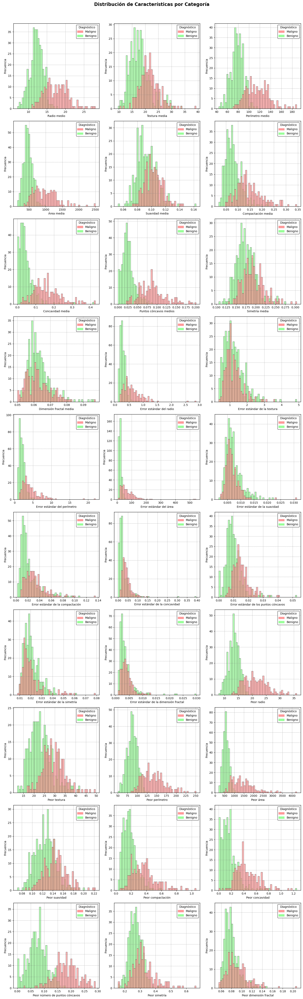

In [28]:
# Número de columnas
n_columns = 3
# Calcular el número de filas necesario
n_rows = (len(num_columns) + n_columns - 1) // n_columns  

# Crear la figura y los ejes para la cuadrícula de histogramas
fig, axes = plt.subplots(n_rows, n_columns, figsize=(15, 5 * n_rows), squeeze=False)

fig.suptitle('Distribución de Características por Categoría', fontsize=16, fontweight='bold')

# Graficar histogramas según target
for idx, feature in enumerate(num_columns):
    row = idx // n_columns
    col = idx % n_columns
    ax = axes[row, col]
    
    sns.histplot(data=df, x=feature, hue='target', bins=50, alpha=0.7, palette=palette, ax=ax)
    ax.set_xlabel(features_esn[feature])
    ax.set_ylabel('Frecuencia')
    
    handles = [patches.Patch(color=palette[0], label='Maligno'), patches.Patch(color=palette[1], label='Benigno')]
    legend = ax.legend(handles=handles, title='Diagnóstico')
    
    ax.set_facecolor('#ffffff')  # Fondo blanco para el área de trazado
    for spine in ax.spines.values():
        spine.set_edgecolor('black')  # Borde negro en el área de trazado
        spine.set_linewidth(1)  # Grosor del borde del área de trazado
    ax.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray')
    
    legend.set_frame_on(True)  # Habilitar el marco de la leyenda
    legend.get_frame().set_edgecolor('black')  # Color del borde de la leyenda
    legend.get_frame().set_linewidth(1)  # Grosor del borde de la leyenda
    legend.get_frame().set_facecolor('#ffffff')  # Color de fondo de la leyenda

# Eliminar ejes vacíos si hay menos gráficos que subplots
for idx in range(len(num_columns), n_rows * n_columns):
    row = idx // n_columns
    col = idx % n_columns
    fig.delaxes(axes[row, col])

# Ajustar el diseño para evitar solapamientos
plt.tight_layout(rect=[0, 0, 1, 0.97]) 

plt.show()


**Observaciones:** 
En el caso benigno, la media y desvío estándar de las características son menores que en el caso maligno. En el caso de la media el resultado es esperable dado que tumores con valores medios de peor radio (o radio medio) o peores puntos cóncavos (entre otros) mayores tiende a ser un diagnóstico de tumor maligno. Además, en algunos casos como en 'peor número de puntos concavos' ambas distribuciones (maligno/beningo) se encuentran separadas (si bien existe zona de superposición) permitiendo definir rangos empíricos de diagnóstico. En otros casos ambas distribuciones se superponen, lo que dificulta definir umbral de separación de clases. También se observó que las frecuencias máximas en el caso maligno son menores que en el caso benigno.

### Distribución de categorías

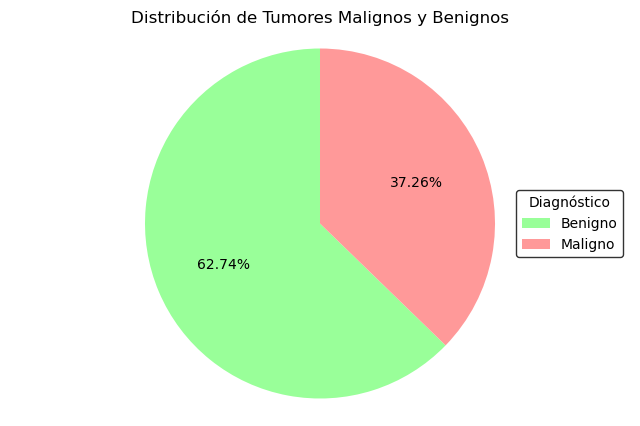

In [29]:
class_counts = df['target'].value_counts()

labels = ['Benigno', 'Maligno']

plt.figure(figsize=(8, 5))
plt.pie(class_counts, autopct='%1.2f%%', colors=['#99ff99', '#ff9999'], startangle=90)
plt.title('Distribución de Tumores Malignos y Benignos')
plt.axis('equal')  # Iguala el aspecto del gráfico para que sea un círculoleg

legend = plt.legend(labels=labels, title='Diagnóstico', loc='right')
frame = legend.get_frame()
frame.set_facecolor('#ffffff') 
frame.set_edgecolor('black')  
frame.set_linewidth(1)  

plt.show()


**Observaciones:**

Los casos malignos representan aproximadamente el 50% de los casos benignos, lo que puso en evidencia que las clases están desbalanceadas, pero el desbalance no es tan extremo. 

### Correlación entre atributos

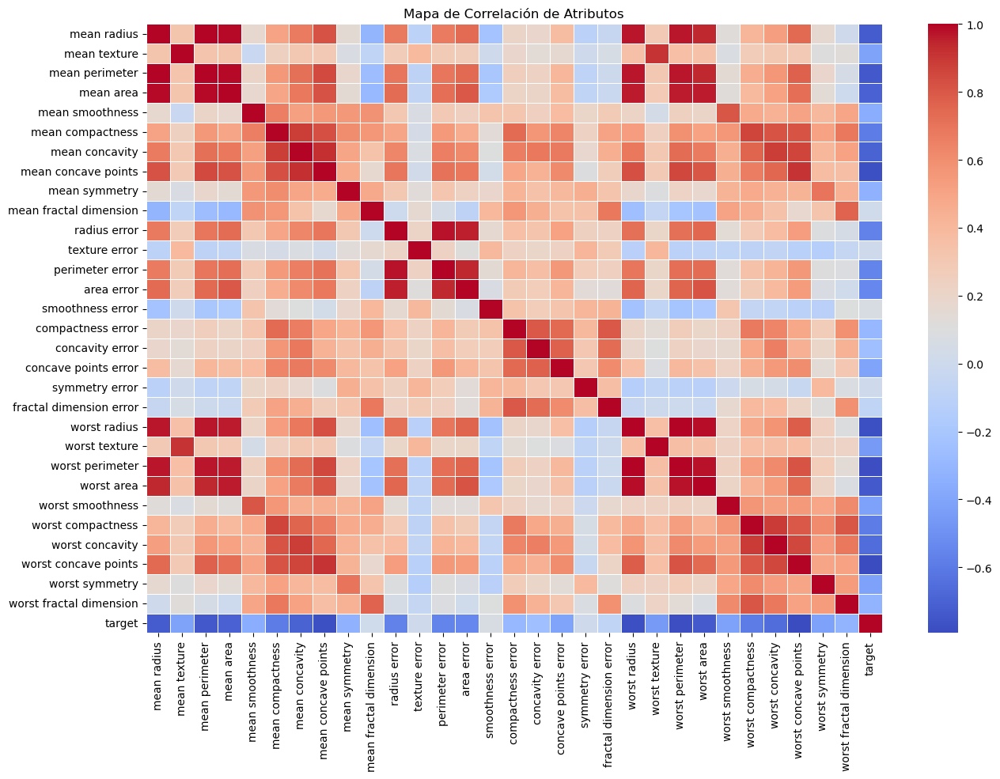

In [30]:
plt.figure(figsize=(15, 10))
correlation = df.corr()
sns.heatmap(correlation, annot=False, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Mapa de Correlación de Atributos')
plt.show()

In [31]:
# Correlacion de cada atributo con el target
correlation_with_target = correlation['target'].sort_values(ascending=False)
print(correlation_with_target)


target                     1.000000
smoothness error           0.067016
mean fractal dimension     0.012838
texture error              0.008303
symmetry error             0.006522
fractal dimension error   -0.077972
concavity error           -0.253730
compactness error         -0.292999
worst fractal dimension   -0.323872
mean symmetry             -0.330499
mean smoothness           -0.358560
concave points error      -0.408042
mean texture              -0.415185
worst symmetry            -0.416294
worst smoothness          -0.421465
worst texture             -0.456903
area error                -0.548236
perimeter error           -0.556141
radius error              -0.567134
worst compactness         -0.590998
mean compactness          -0.596534
worst concavity           -0.659610
mean concavity            -0.696360
mean area                 -0.708984
mean radius               -0.730029
worst area                -0.733825
mean perimeter            -0.742636
worst radius              -0

In [32]:
# Umbral asumido => Maxima correlacion entre atributos
threshold = 0.7

# Pares de atributos con correlación alta (> umbral o < -umbral)
high_correlation_pairs = (correlation.abs() > threshold) & (correlation != 1.0)
high_correlation_attrs = correlation[high_correlation_pairs]

pairs = set()
for i in high_correlation_attrs.index:
    for j in high_correlation_attrs.columns:
        if pd.notna(high_correlation_attrs.loc[i, j]):
            index = tuple(sorted([i, j]))
            pairs.add((*index, high_correlation_attrs.loc[i, j]))

for k in pairs:
    print(f"{k[0]} - {k[1]} : {k[2]}")

concavity error - fractal dimension error : 0.727372183881192
mean texture - worst texture : 0.912044588840421
mean concave points - worst concavity : 0.7523994975749643
mean area - mean perimeter : 0.9865068039913908
compactness error - mean compactness : 0.7387217896603929
compactness error - concave points error : 0.7440826676953254
worst compactness - worst fractal dimension : 0.8104548563116118
area error - mean area : 0.8000859212343204
mean radius - worst area : 0.9410824595860461
mean concave points - mean radius : 0.8225285223871784
mean area - mean radius : 0.9873571700566129
mean concavity - worst compactness : 0.7549680159063961
area error - worst perimeter : 0.761212636068759
mean concave points - mean perimeter : 0.8509770412528194
worst compactness - worst concavity : 0.8922608987764685
mean area - radius error : 0.7325622269972968
mean radius - worst radius : 0.9695389726112049
perimeter error - worst perimeter : 0.7210313099890177
mean concave points - mean concavity :

**Observaciones:** 

En el mapa de índices de correlación, se detectan dos diagonales, abajo a la izquierda y arriba a la derecha del mapa. Esto está asociado la elevada correlación que hay entre el valor medio de una característica y el peor valor de la misma. Con esto se pone en evidencia la existencia de dependencia (lineal) entre estas características.

Para trabajar con un conjunto de características independientes, parecería conveniente eliminar los datos relacionados con los peores valores de los atributos  y quedarse con los valores medios. Para esto se puede usar un umbral de correlación de 0,7 (Guyon y Elisseeff, 2003).

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before opera

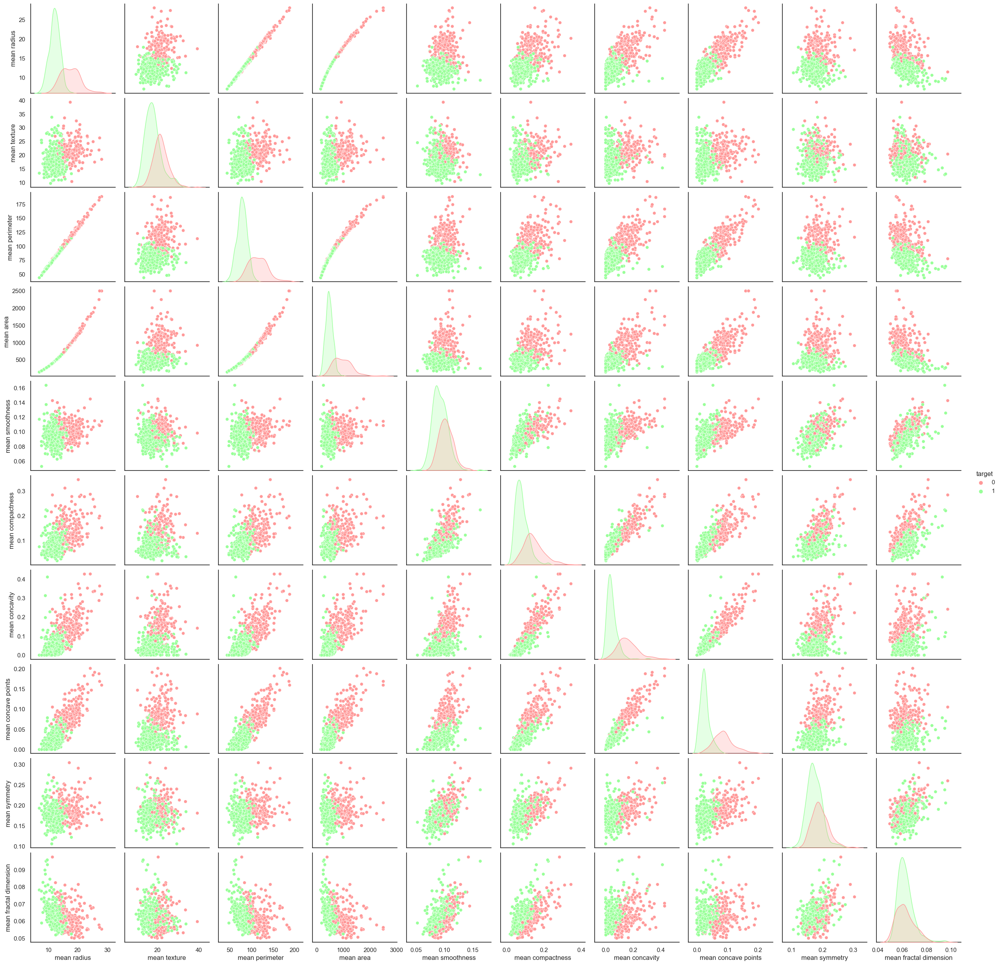

In [33]:
sns.set(style='white') 

df_mean = df.filter(regex='mean|target')
sns.pairplot(data=df_mean, diag_kind="kde", hue='target', palette=palette);


/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before opera

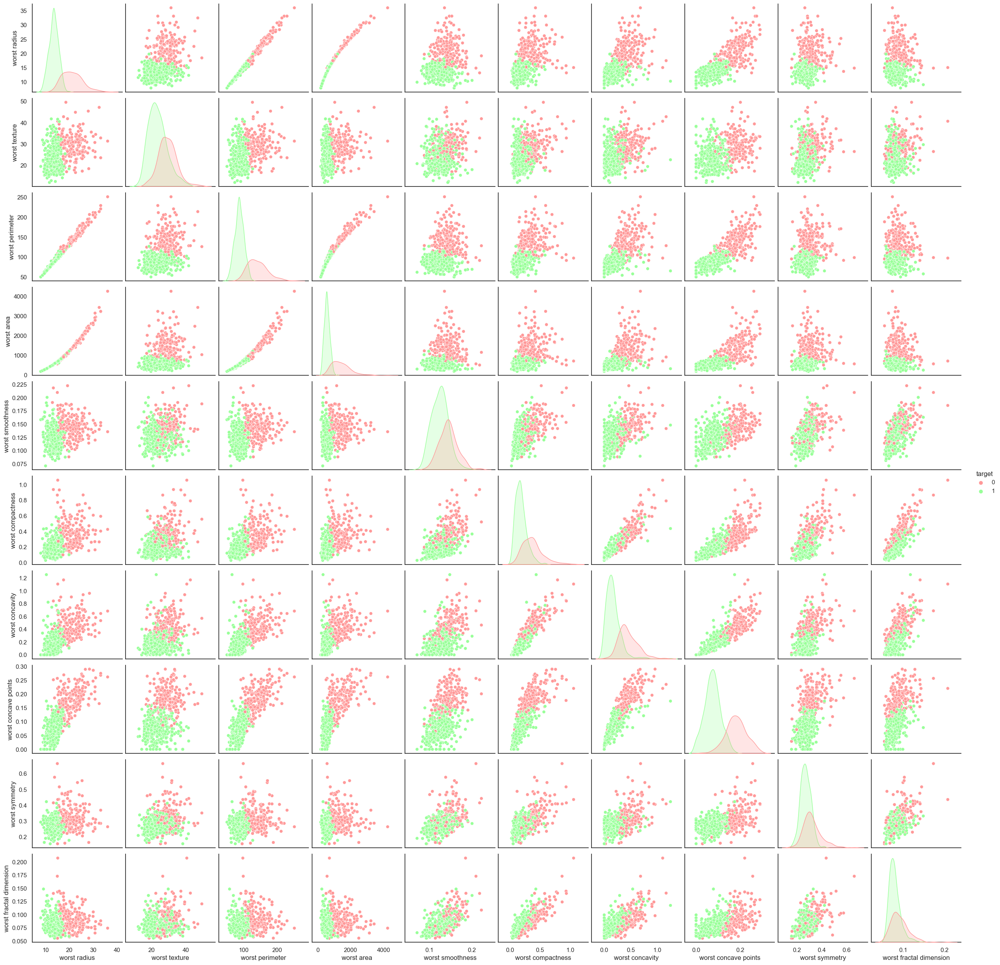

In [34]:
df_worst = df.filter(regex='worst|target')
sns.pairplot(data=df_worst, diag_kind="kde", hue='target', palette=palette);

/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before opera

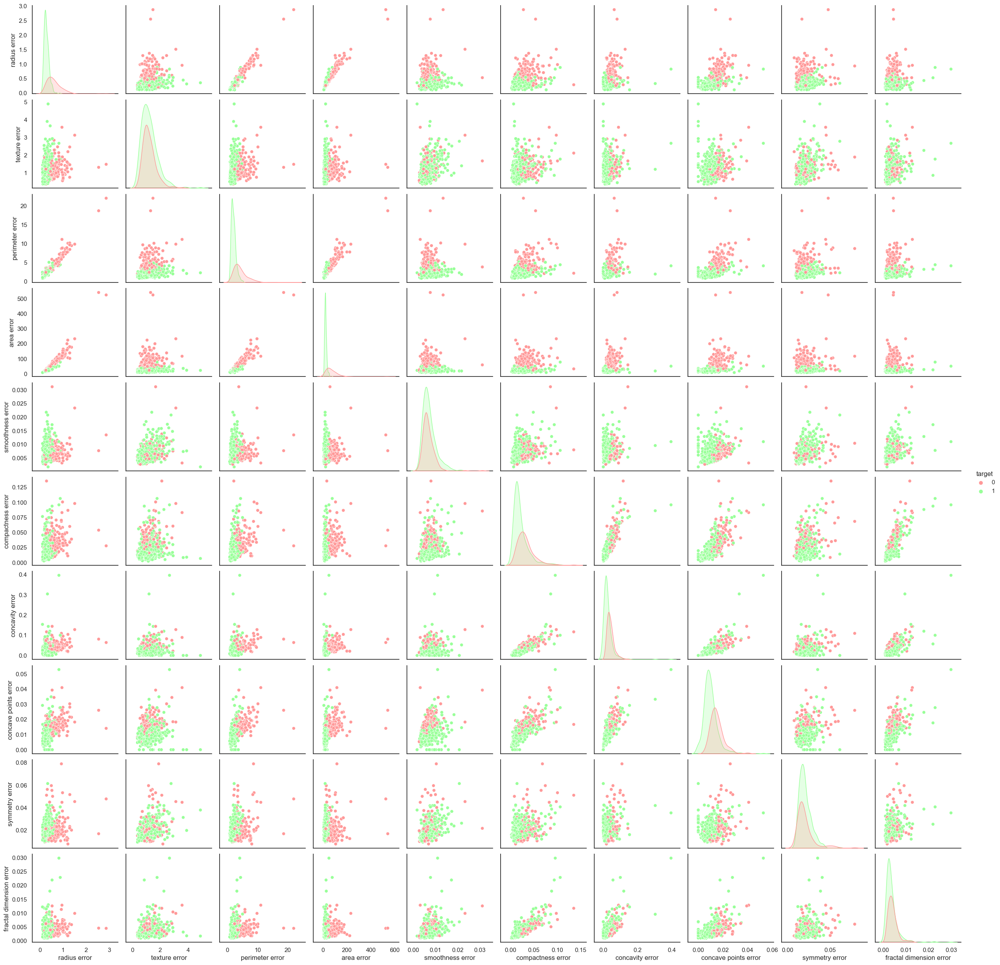

In [35]:
df_error = df.filter(regex='error|target')
sns.pairplot(data=df_error, diag_kind="kde", hue='target', palette=palette);

**Observaciones:** 

Es interesante resaltar la marcada dependencia lineal que existe entre el radio y el perímetro, y la dependencia cuadrática entre estos y el área. Esto tiene sentido si consideramos a los tumores con una forma aproximadamente circular.

### Box plots

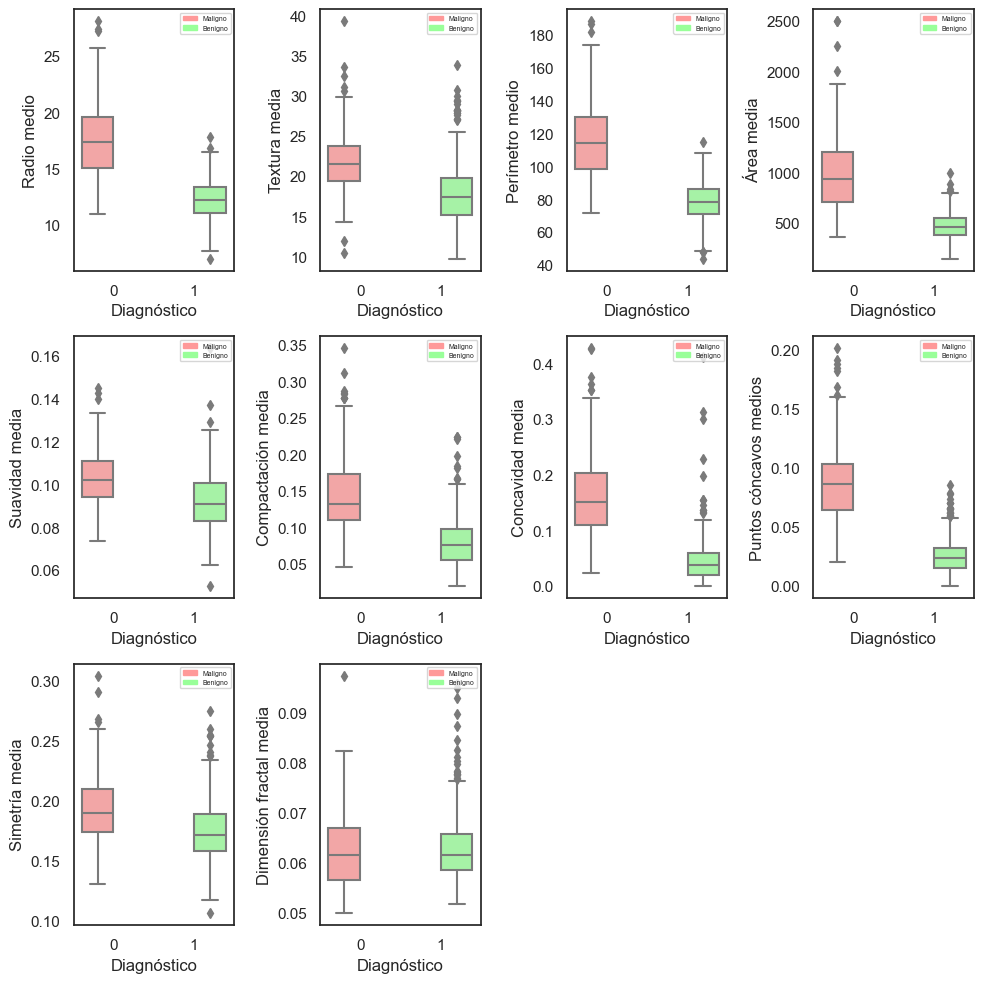

In [36]:
plt.figure(figsize=(10, 10))

for i, feature in enumerate(df_mean.drop(columns='target')):
    plt.subplot(10 // 4 + 1, 4, i + 1)  
    sns.boxplot(data=df, x='target', y=feature, palette=palette, hue='target')
    plt.xlabel('Diagnóstico')
    plt.ylabel(features_esn[feature])
    handles = [patches.Patch(color=palette[0], label='Maligno'), patches.Patch(color=palette[1], label='Benigno')]
    plt.legend(handles=handles, fontsize='5', loc='upper right')

plt.tight_layout()
plt.show()


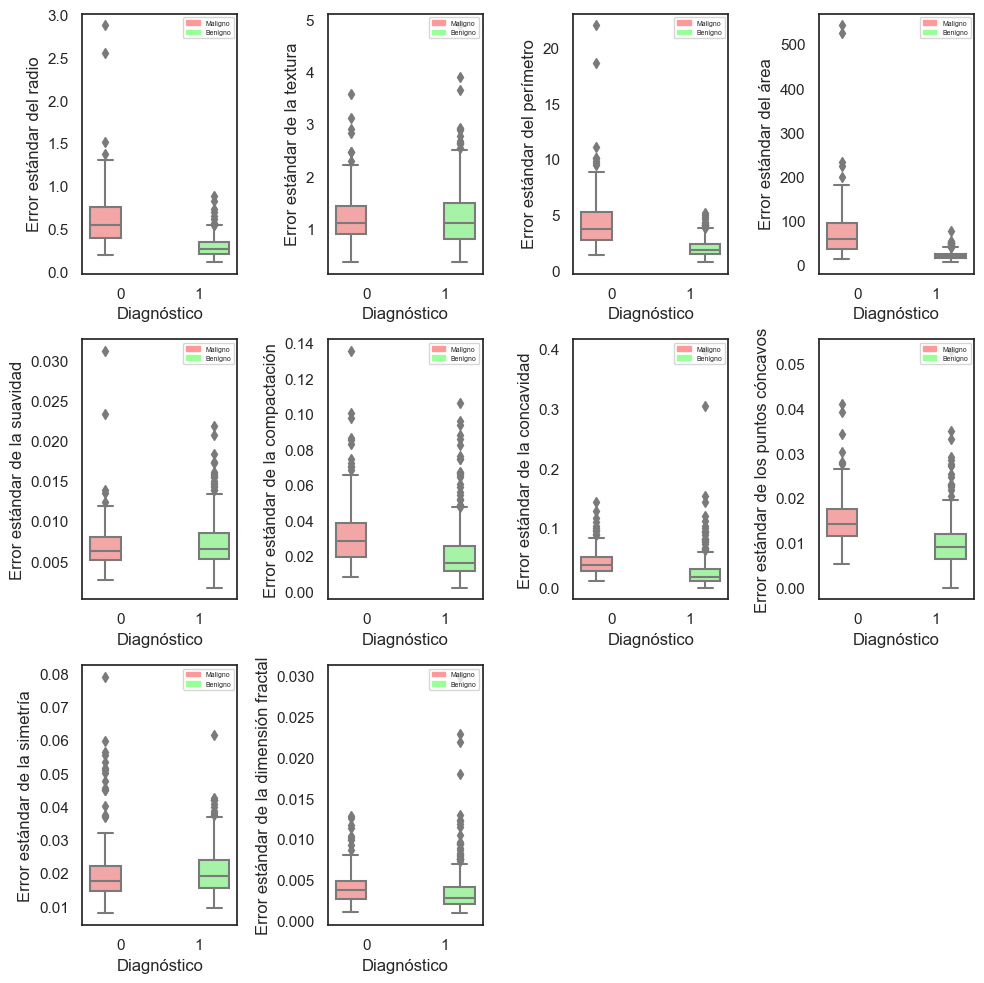

In [37]:
plt.figure(figsize=(10, 10))

for i, feature in enumerate(df_error.drop(columns='target')):
    plt.subplot(10 // 4 + 1, 4, i + 1)  
    sns.boxplot(data=df, x='target', y=feature, palette=palette, hue='target')
    plt.xlabel('Diagnóstico')
    plt.ylabel(features_esn[feature])
    handles = [patches.Patch(color=palette[0], label='Maligno'), patches.Patch(color=palette[1], label='Benigno')]
    plt.legend(handles=handles, fontsize='5', loc='upper right')

plt.tight_layout()
plt.show()

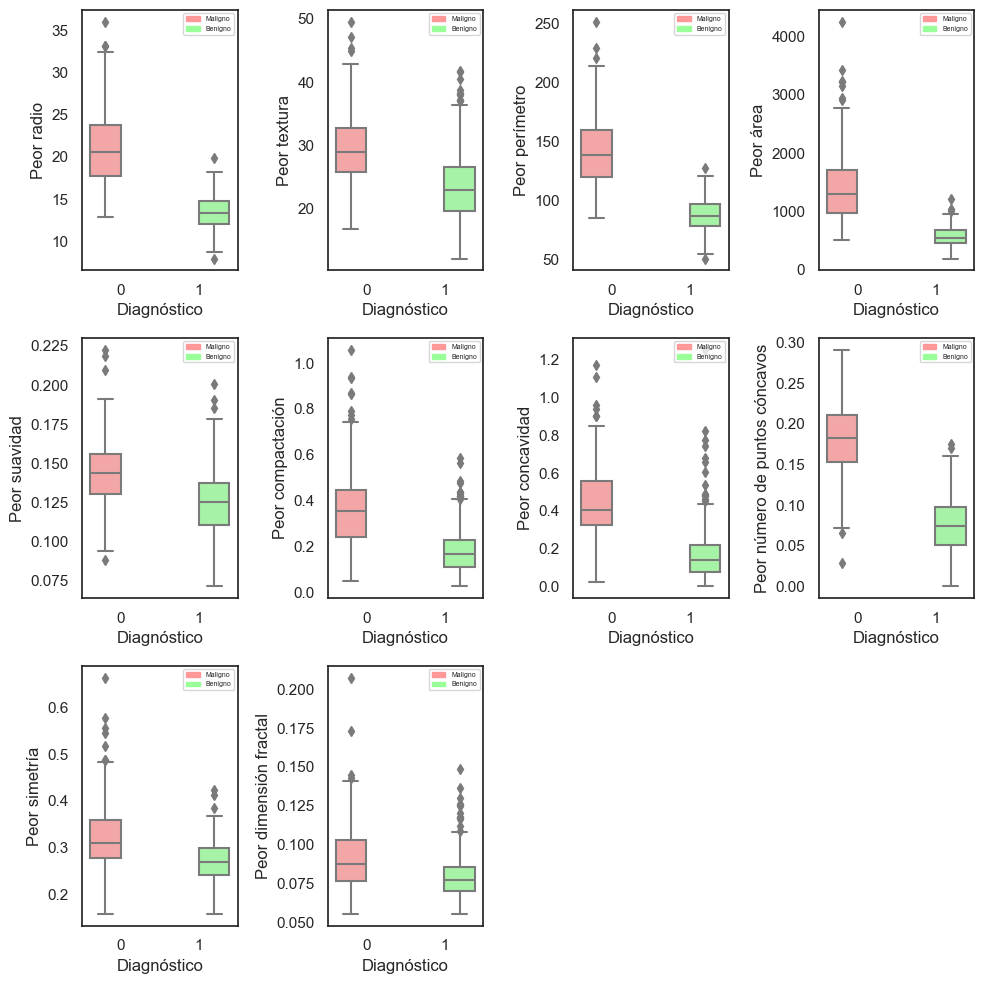

In [38]:
plt.figure(figsize=(10, 10))

for i, feature in enumerate(df_worst.drop(columns='target')):
    plt.subplot(10 // 4 + 1, 4, i + 1)  
    sns.boxplot(data=df, x='target', y=feature, palette=palette, hue='target')
    plt.xlabel('Diagnóstico')
    plt.ylabel(features_esn[feature])
    handles = [patches.Patch(color=palette[0], label='Maligno'), patches.Patch(color=palette[1], label='Benigno')]
    plt.legend(handles=handles, fontsize='5', loc='upper right')

plt.tight_layout()
plt.show()

**Observaciones:** 

En este punto podría aplicarse una técnica para los *outliers* identificados como poda por ejemplo, pero como se verá más adelante el conjunto de observaciones original ya presenta los mejores resultados de performance de modelos de aprendizaje supervisado. Por este motivo se decidió no manipularlos.

## Desarrollo de modelos de clasificación

In [39]:
"""
Dibuja la matriz de confusión del modelo
"""
def showConfMatrix(y_ts, y_pred, classes, model_name, color='Greens', n_graph=2):
    ## Matriz de confusión
    cm = confusion_matrix(y_ts, y_pred)
    
    g_cm = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)

    if n_graph == 2:
        fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(15, 5), gridspec_kw={'width_ratios': [1, 1]})
        ax0.axvline(x=0.5, color='gray', linestyle='--')
        ax0.axhline(y=0.5, color='gray', linestyle='--')
        ax0.text(0.25, 0.75, 'VERDADEROS\nNEGATIVOS', fontsize=12, ha='center', va='center')
        ax0.text(0.75, 0.75, 'FALSOS\nPOSITIVOS', fontsize=12, ha='center', va='center')
        ax0.text(0.25, 0.25, 'FALSOS\nNEGATIVOS', fontsize=12, ha='center', va='center')
        ax0.text(0.75, 0.25, 'VERDADEROS\nPOSITIVOS', fontsize=12, ha='center', va='center')
        ax0.set_xlim(0, 1)
        ax0.set_ylim(0, 1)
        ax0.axis('off')
    else:
        fig, ax1 = plt.subplots(figsize=(7, 5))

    g_cm.plot(ax=ax1, cmap=color)
    ax1.set_title(model_name)
    ax1.set_xlabel('Predicción') 
    ax1.set_ylabel('Valor verdadero') 
    
    plt.tight_layout()
    plt.show()

    return cm.ravel()
    
"""
Muestra la curva ROC del modelo
Devuelve el área bajo la curva
"""

def showROC(y_ts, arr_models):

    plt.figure(figsize=(5, 5))
    auc_models = {}
    
    for model_name, color, y_probs in arr_models:
 
        fp, p, thresholds = roc_curve(y_ts, y_probs)
        plt.plot(fp, p, color=color, label=model_name)
        auc_models[model_name] = auc(fp, p)
        
    plt.plot([0, 1], [0, 1], color='red', linestyle='--')
    plt.xlabel("Tasa de Falsos Positivos")
    plt.ylabel("Tasa de Verdaderos Positivos")
    plt.title('Curva ROC')
    plt.legend()
    plt.grid(True)
    plt.show()

    return auc_models

"""
Devuelve las métricas del modelo
"""
def getMetrics(y_ts, y_pred, cm, model_name):
    
    metrics = {}
    tn, fp, fn, tp = cm
    #TN (True Negatives): Verdaderos negativos.
    #FP (False Positives): Falsos positivos.
    #FN (False Negatives): Falsos negativos.
    #TP (True Positives): Verdaderos positivos.

    metrics[model_name] = [
        # Exactitud => Proporción de instancias correctamente clasificadas 
        #(tanto positivas como negativas) respecto al total de instancias.
        ["Accuracy", round(accuracy_score(y_ts, y_pred), 4)],
        # Precisión => cuántas de las predicciones positivas 
        # del modelo son realmente correctas.
        ["Precision", round(precision_score(y_ts, y_pred, zero_division=0), 4)],
        # Especificidad => qué tan bien el modelo puede identificar las instancias negativas 
        # y evitar clasificarlas incorrectamente como positivas
        ["Specificity",  round(tn / (tn + fp), 4)],     
        # Exactitud balanceada => considera el desbalance de clases al calcular la exactitud
        ["Balanced Accuracy",  round(((tp / (tp + fn)) + (tn / (tn + fp))) / 2, 4)], 
        # Sensibilidad = Recuperación => capacidad del modelo 
        #para identificar correctamente las instancias positivas.
        ["Recall", round(recall_score(y_ts, y_pred, zero_division=0), 4)], 
        # Equilibrio entre precisión y recuperación
        ["F1-Score", round(f1_score(y_ts, y_pred, zero_division=0), 4)], 
    ]

    return metrics

def printMetrics(metrics, n, s, b):
    
    model = next(iter(metrics))
    
    df_metrics = pd.DataFrame ([model], columns=['Modelo'])

    df_metrics['Características'] = n
    df_metrics['Escalamiento'] = s
    df_metrics['Búsqueda Hp'] = b 
   
    for metric, value in metrics[model]:
        df_metrics[metric] = value
    
    return df_metrics


### Regresión Logística

In [40]:
"""
Ejecuta Regresión Logística y devuelve predicciones, clases, y probabilidades
"""
def LogRegression (X_tr, y_tr, X_ts, y_ts):
    lregression = LogisticRegression(random_state = 42, class_weight="balanced")
    lregression.fit(X_tr, y_tr)

    y_pred_lr = lregression.predict(X_ts)
    y_probs_lr = lregression.predict_proba(X_ts)[:, -1]
    
    return y_pred_lr, lregression.classes_, y_probs_lr



#### Regresión Logística con ajuste de hiperparámetros

In [41]:
"""
Utiliza validación cruzada para encontrar la combinación que mejor 
optimiza el rendimiento del modelo según el criterio de evaluación dado
"""
def LogRegressionHiperP (X_tr, y_tr, X_ts, y_ts, param_grid, max_i, p_cv, metric):

    lregression = LogisticRegression(max_iter=max_i)
    grid_search = GridSearchCV(lregression, param_grid, cv=p_cv, scoring=metric)

    grid_search.fit(X_tr, y_tr)

    # Mejor modelo
    best_model = grid_search.best_estimator_
                                   
    y_pred_lr = best_model.predict(X_ts)

    y_probs_lr = best_model.predict_proba(X_ts)[:, -1]

    # Devuelve lo mismo que la función anterior + los mejores hiperparámetros encontrados
    return y_pred_lr, best_model.classes_, y_probs_lr, best_model


### Clasificador por vectores de soporte

In [42]:
def SVCHiperP (X_tr, y_tr, X_ts, y_ts, param_grid, p_cv, metric):

    # Support Vector Classifier
    model = SVC(probability=True)

    # Grilla de hiper-parámetros
    grid_search = GridSearchCV(model, param_grid, cv=p_cv, scoring=metric) 

    # Entrena el modelo
    grid_search.fit(X_tr, y_tr)

    # Obtiene los mejores hiper-parámetros
    best_model = grid_search.best_estimator_

    # Obtiene las predicciones en el conjunto de prueba
    y_pred_svm = best_model.predict(X_ts)

    y_probs_svm = best_model.predict_proba(X_ts)[:, -1]

    return y_pred_svm, best_model.classes_, y_probs_svm, best_model


### Árbol de Clasificación

In [43]:
def DecisionTreeHiperP (X_tr, y_tr, X_ts, y_ts, param_grid, p_cv, metric):

    # Crea el modelo de arbol de clasificacion
    model = DecisionTreeClassifier()

    # Configura GridSearchCV
    grid_search = GridSearchCV(model, param_grid, cv=p_cv, scoring=metric)

    # Entrena el modelo
    grid_search.fit(X_tr, y_tr)

    # Obtiene los mejores hiper-parametros
    best_model = grid_search.best_estimator_

    # Obtiene las predicciones en el conjunto de prueba
    y_pred_dt = best_model.predict(X_ts)

    y_probs_dt = best_model.predict_proba(X_ts)[:, -1]

    return y_pred_dt, best_model.classes_, y_probs_dt, best_model

### Clasificador KNN

In [44]:
def KnnHiperP (X_tr, y_tr, X_ts, y_ts, param_grid, p_cv, metric):

    knn = KNeighborsClassifier()

    # Búsqueda de hiperparámetros por GridSearchCV
    grid_search = GridSearchCV(knn, param_grid, cv=p_cv, scoring=metric)

    grid_search.fit(X_tr, y_tr)

    # Obtener los mejores hiperparámetros
    best_model = grid_search.best_estimator_
        
    # Obtener las predicciones en el conjunto de prueba
    y_pred_knn = best_model.predict(X_ts)

    return y_pred_knn, best_model.classes_, best_model

### Perceptrón

In [45]:
def PerceptronHiperP (X_tr, y_tr, X_ts, y_ts, param_grid, p_cv, metric):

    # Crea el modelo de perceptron
    model = Perceptron()

    # Realiza la busqueda de hiperparametros con GridSearchCV
    grid_search = GridSearchCV(model, param_grid, cv=p_cv, scoring=metric)

    # Entrena el modelo
    grid_search.fit(X_tr, y_tr)

    # Obtiene los mejores hiperparametros
    best_model = grid_search.best_estimator_
    
    # Obtiene las predicciones en el conjunto de prueba
    y_pred_p = best_model.predict(X_ts)

    return y_pred_p, best_model.classes_, best_model

### Ensamble - Bagging

In [46]:
def EnsambleBagg(X_tr, y_tr, X_ts, y_ts, estimators, params, n, metric, p_cv):

    # Clasificador de Bagging
    bagging = BaggingClassifier(random_state=42)

    # Configurar la busqueda aleatoria
    random_search = RandomizedSearchCV(bagging, params, n_iter=n, scoring=metric, cv=p_cv, random_state=42, n_jobs=-1)

    # Ajusta el modelo
    random_search.fit(X_tr, y_tr)

    # Predice con el mejor modelo encontrado
    best_model = random_search.best_estimator_
    y_pred_ebagg = best_model.predict(X_ts)

    return y_pred_ebagg, best_model.classes_, best_model

### Ensamble Boosting

In [47]:
def EnsambleBoost(X_tr, y_tr, X_ts, y_ts, param_grid, metric, p_cv):

    # Crea el ensamble
    model = XGBClassifier()

    # Realiza la busqueda de hiperparámetros con GridSearchCV
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid, scoring=metric, cv=p_cv, n_jobs=-1, verbose=1)

    # Entrena el modelo
    grid_search.fit(X_tr, y_tr)

    # Obtiene los mejores hiperparámetros
    best_model = grid_search.best_estimator_

    # Obtiene las predicciones en el conjunto de prueba
    y_pred_boost = best_model.predict(X_ts)

    y_probs_boost = best_model.predict_proba(X_ts)[:, -1]
    
    return y_pred_boost, best_model.classes_, y_probs_boost, best_model


### *Comparativa de la performance de los modelos*

#### Línea Base

Tomamos como referencia inicial, una regresión logística


Datos escalados con StandardScaler


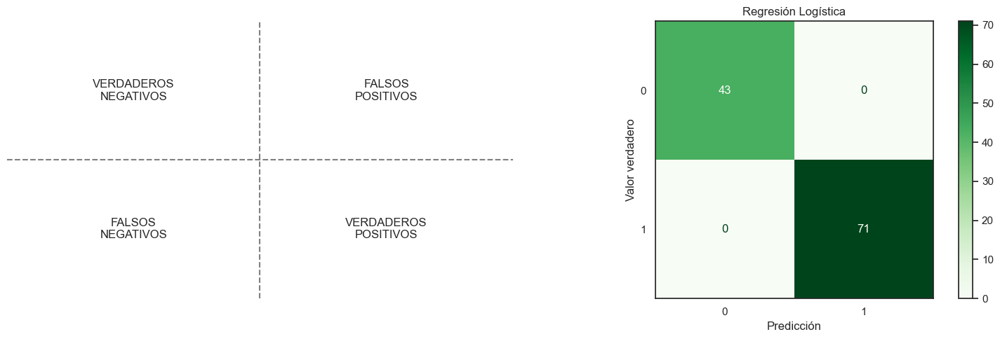

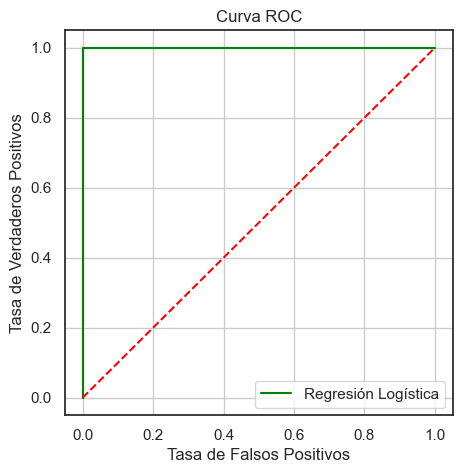


Datos escalados con MinMaxScaler


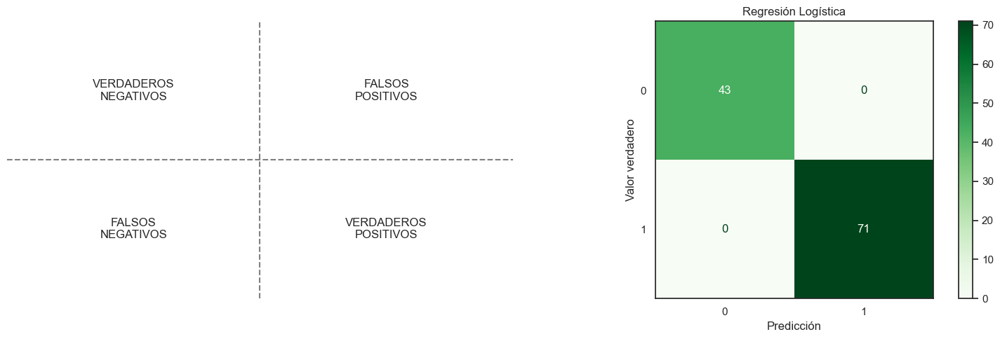

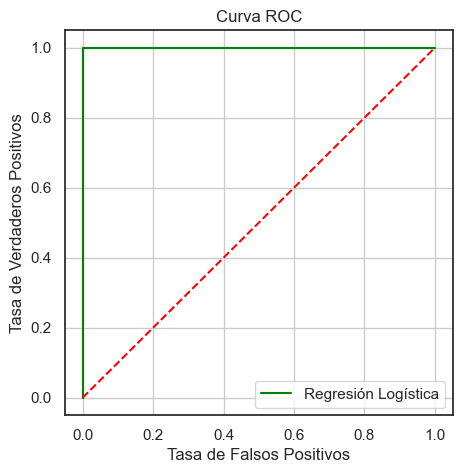


Datos escalados con RobustScaler


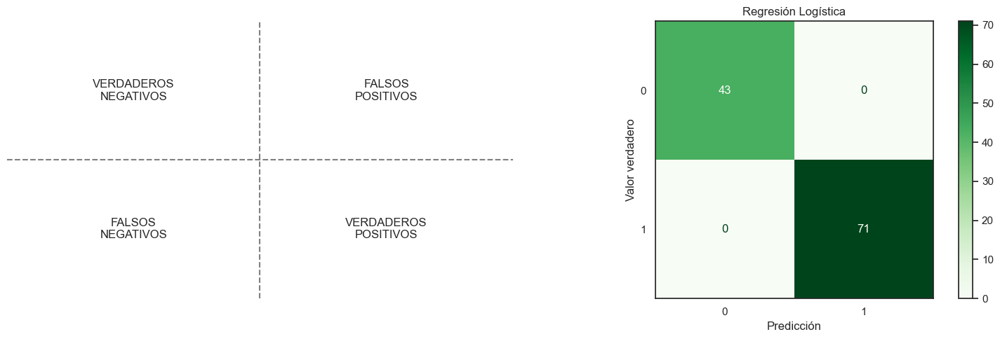

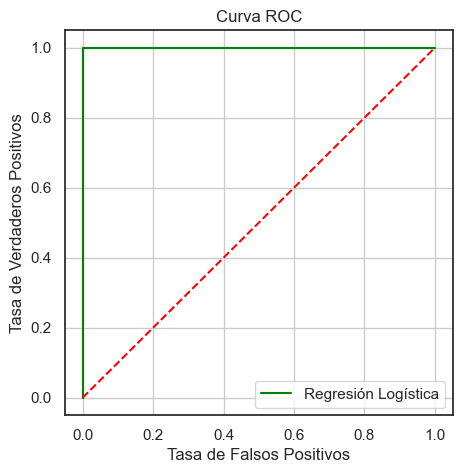


Datos escalados con Normalizer


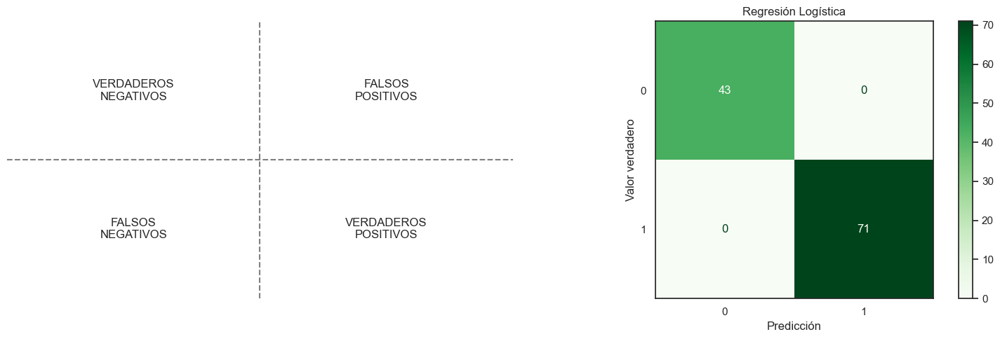

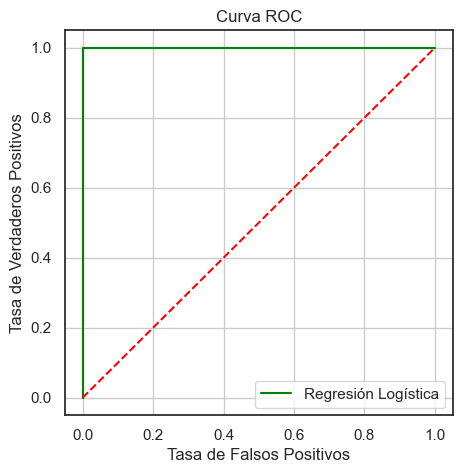

Modelo,Escalador,Accuracy,Precision,Specificity,Balanced Accuracy,Recall,F1-Score
Regresión Logística,StandardScaler,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
Regresión Logística,MinMaxScaler,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
Regresión Logística,RobustScaler,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
Regresión Logística,Normalizer,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [48]:
# Regresión Logística con diferentes escaladores
dfm_full = pd.DataFrame()

for i in scaled_df:
    print (f"\nDatos escalados con {i}")

    
    X_train_SS = scaled_df[i][0]
    X_test_SS = scaled_df[i][1]

    mname = "Regresión Logística"
    
    lr_y_pred, lr_classes, lr_y_probs = LogRegression (X_train_SS, y_train, X_test_SS, y_test)
    
    confM = showConfMatrix(y_test, lr_y_pred, lr_classes, mname)
    
    showROC(y_test, [[mname, "green", lr_y_probs]])

    lrs_metrics = getMetrics(y_test, lr_y_pred, confM, mname)
        
    dfm = pd.DataFrame({
        'Modelo': [mname],
        'Escalador': [i]
    })
    
    for model, metrics in lrs_metrics.items():
        for metric_name, metric_value in metrics:
            dfm[metric_name] = [metric_value]

    dfm_full = pd.concat([dfm_full, dfm], ignore_index=True)
    
display(dfm_full.style.hide(axis='index'))



**Observaciones:**

En todos los casos el desempeño del modelo resulta perfecto, por lo que, evaluamos reducir la cantidad de features del dataset y hacer una comparativa de desempeño con los otros modelos de clasificación.

#### Análisis de la curva de aprendizaje

Por otro lado, fue interés del equipo conocer como varía la precisión del modelo con diferentes tamaños de muestra. Para eso, se analizó la curva de aprendizaje para ver cómo el tamaño del conjunto de entrenamiento afecta la precisión del modelo.

In [49]:
# Genera la curva de aprendizaje con validacion cruzada de 5 folds
# Escalar los datos
scaler = StandardScaler()
X_t_scaled = scaler.fit_transform(X_train)

train_sizes, train_scores, test_scores = learning_curve(
    LogisticRegression(max_iter=1000), X_t_scaled, y_train, cv=5, 
    train_sizes=np.linspace(0.1, 1.0, 10), scoring='accuracy'
)

In [50]:
# Calcula las medias y desviaciones estandar para las precisiones
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

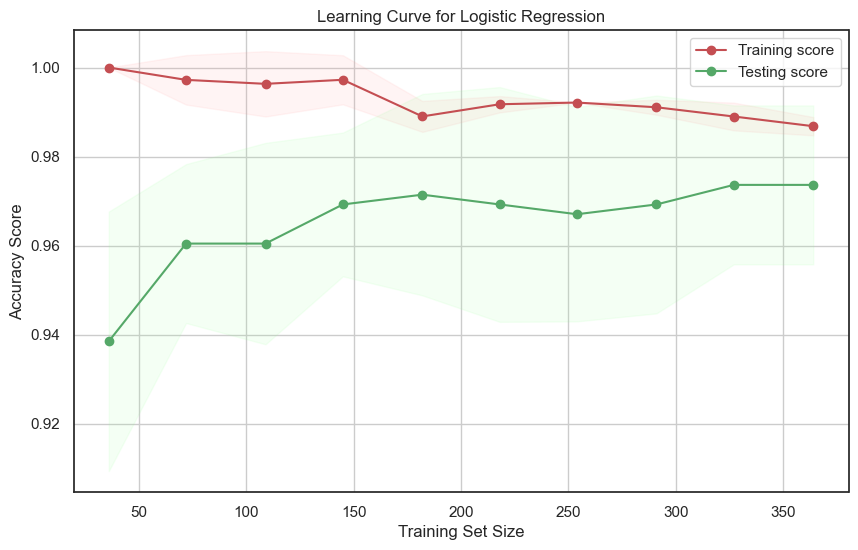

In [51]:
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, 'o-', color="r", label="Training score")
plt.plot(train_sizes, test_mean, 'o-', color="g", label="Testing score")

plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, color="#FF9999", alpha=0.1)
plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, color="#99FF99", alpha=0.1)

plt.title("Learning Curve for Logistic Regression")
plt.xlabel("Training Set Size")
plt.ylabel("Accuracy Score")
plt.legend(loc="best")
plt.grid()
plt.show()

**Observaciones:** 

Este gráfico muestra cómo la precisión del modelo varía según el tamaño del conjunto de entrenamiento.

En tamaños pequeños de entrenamiento, como la precisión media de entrenamiento es alta pero la de evaluación es baja, el modelo podría estar sobreajustando para esos casos.
Se observó cierta convergencia, es decir las curvas medias de entrenamiento y evaluación se acercan a medida que aumenta el tamaño del conjunto de entrenamiento, el modelo generaliza.

Por otro lado, hay una disminución progresiva del desvío estándar de la precisión del conjunto de prueba, esto se debe a que cada una de las evaluaciones en los folds de la validación cruzada ve performance diferentes que al aumentar el tamaño de la muestra convergen. Esto apoya la idea de que el modelo adopta la capacidad de generalizar independientemente del conjunto de datos.

## Selección de características

### Decision Tree

In [52]:
### Decision Tree 
# Entrena el modelo Decision Tree
model = DecisionTreeClassifier(random_state=42)
model.fit(X_train, y_train)

# Predice y evalua el modelo con todas las caracteristicas
y_pred_all_features = model.predict(X_test)
accuracy_all_features = accuracy_score(y_test, y_pred_all_features)
print(f'Exactitud con todas las características: {accuracy_all_features:.2f}')

# Obtiene la importancia de las caracteristicas
importances = model.feature_importances_
feature_importance_df = pd.DataFrame({
    'Feature': X.columns, 
    'Importance': importances}).sort_values(by='Importance', ascending=False)

# Muestra la importancia de las caracteristicas
print("Importancia de las características:")
print(feature_importance_df)

# Selecciona las caracteristicas mas importantes
selector = SelectFromModel(model, prefit=True, threshold=0.01)
X_train_selected = selector.transform(X_train)
X_test_selected = selector.transform(X_test)

# Muestra las caracteristicas seleccionadas
selected_features = X.columns[selector.get_support()]
print("Características seleccionadas:")
print(selected_features)

# Entrena el modelo Decision Tree con las caracteristicas seleccionadas
model_selected = DecisionTreeClassifier(random_state=42)
model_selected.fit(X_train_selected, y_train)

# Predice y evaluar el modelo con las caracteristicas seleccionadas
y_pred_selected_features = model_selected.predict(X_test_selected)
accuracy_selected_features = accuracy_score(y_test, y_pred_selected_features)

print()
print(f'Exactitud con las características seleccionadas: {accuracy_selected_features:.2f}')
print("Características seleccionadas:\n")

for item in selected_features:
    print(features_esn[item])

df_selection_1 = pd.DataFrame(data = {
    'DecisionTree': selected_features
})

Exactitud con todas las características: 0.95
Importancia de las características:
                    Feature  Importance
7       mean concave points    0.691420
27     worst concave points    0.065651
1              mean texture    0.058478
20             worst radius    0.052299
22          worst perimeter    0.051494
19  fractal dimension error    0.018554
21            worst texture    0.017445
17     concave points error    0.015931
13               area error    0.011983
24         worst smoothness    0.009233
16          concavity error    0.006276
14         smoothness error    0.001237
23               worst area    0.000000
18           symmetry error    0.000000
25        worst compactness    0.000000
26          worst concavity    0.000000
28           worst symmetry    0.000000
0               mean radius    0.000000
15        compactness error    0.000000
12          perimeter error    0.000000
11            texture error    0.000000
10             radius error    0.00000

/opt/anaconda3/lib/python3.11/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
/opt/anaconda3/lib/python3.11/site-packages/sklearn/base.py:432: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


**Observaciones:**

Poco impacto en los resultados del modelo al aplicar este método de selección.

### Recursive feature elimination

#### Forward


Número de características seleccionadas: 1
Características seleccionadas: Index(['worst area'], dtype='object')
Exactitud del modelo: 0.95

Número de características seleccionadas: 2
Características seleccionadas: Index(['worst area', 'worst concave points'], dtype='object')
Exactitud del modelo: 0.96

Número de características seleccionadas: 3
Características seleccionadas: Index(['worst radius', 'worst area', 'worst concave points'], dtype='object')
Exactitud del modelo: 0.96

Número de características seleccionadas: 4
Características seleccionadas: Index(['worst radius', 'worst texture', 'worst area', 'worst concave points'], dtype='object')
Exactitud del modelo: 0.96

Número de características seleccionadas: 5
Características seleccionadas: Index(['radius error', 'worst radius', 'worst texture', 'worst area',
       'worst concave points'],
      dtype='object')
Exactitud del modelo: 0.97

Número de características seleccionadas: 6
Características seleccionadas: Index(['mean conca

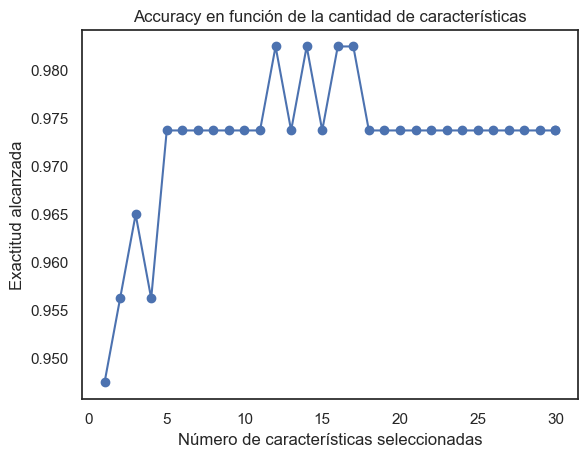

In [53]:
# Escalar las características
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

feature_names = X.columns

model = LogisticRegression(max_iter=10000)  # Sí o sí el modelo converge

gx=[]
gy=[]

feats = []

for i in range(1, 32):
    rfe = RFE(estimator=model, n_features_to_select=i)

    rfe.fit(X_train_scaled, y_train)

    X_train_selected = rfe.transform(X_train_scaled)
    X_test_selected = rfe.transform(X_test_scaled)

    model.fit(X_train_selected, y_train)
    y_pred = model.predict(X_test_selected)
    accuracy = accuracy_score(y_test, y_pred)

    print(f'\nNúmero de características seleccionadas: {rfe.n_features_}')
    print(f'Características seleccionadas: {feature_names[rfe.support_]}')
    print(f'Exactitud del modelo: {accuracy:.2f}')

    feats.append(feature_names[rfe.support_])
    gx.append(rfe.n_features_)
    gy.append(accuracy)

# Crear gráfico de línea
plt.plot(gx, gy, marker='o', linestyle='-', color='b')
plt.title('Accuracy en función de la cantidad de características')
plt.xlabel('Número de características seleccionadas')
plt.ylabel('Exactitud alcanzada')
plt.show()

median_value = np.median(gy)
indices = np.where(np.array(gy) == median_value)[0]

df_selection_2 = pd.DataFrame(data = {
    'RFE F': feats[gx[indices[0]]]
})


#### Backward

Selected Features: ['radius error', 'worst radius', 'worst texture', 'worst area', 'worst concave points']

Feature Ranking: {'mean radius': 9, 'mean texture': 14, 'mean perimeter': 15, 'mean area': 7, 'mean smoothness': 24, 'mean compactness': 12, 'mean concavity': 13, 'mean concave points': 2, 'mean symmetry': 19, 'mean fractal dimension': 25, 'radius error': 1, 'texture error': 22, 'perimeter error': 11, 'area error': 3, 'smoothness error': 18, 'compactness error': 5, 'concavity error': 21, 'concave points error': 20, 'symmetry error': 16, 'fractal dimension error': 17, 'worst radius': 1, 'worst texture': 1, 'worst perimeter': 6, 'worst area': 1, 'worst smoothness': 8, 'worst compactness': 26, 'worst concavity': 4, 'worst concave points': 1, 'worst symmetry': 10, 'worst fractal dimension': 23}


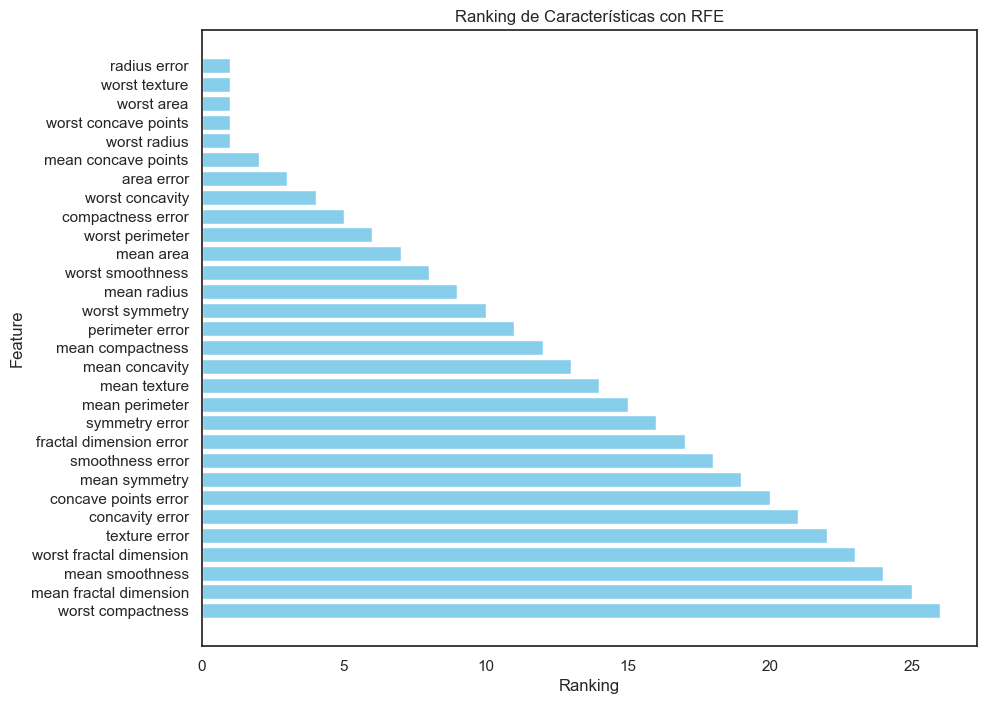

In [54]:
# Establece el modelo de base
model = LogisticRegression(solver='liblinear')

# Aplica RFE para seleccion de caracteristicas 
#(implementa el método wrapper backward eliminando las características menos importantes)
rfe = RFE(model, n_features_to_select=5)
fit = rfe.fit(X_train_scaled, y_train)

# Evalua las caracteristicas seleccionadas
selected_features = X_train.columns[fit.support_]
print(f"Selected Features: {selected_features.tolist()}")
print()
# Para ver el ranking de todas las características
ranking = fit.ranking_
print(f"Feature Ranking: {dict(zip(X.columns, ranking))}")

features_df = pd.DataFrame({
    'Feature': X_train.columns,
    'Ranking': ranking
})

df_selection_3 = features_df.sort_values(by='Ranking')

plt.figure(figsize=(10, 8))
plt.barh(df_selection_3['Feature'], df_selection_3['Ranking'], color='skyblue')
plt.xlabel('Ranking')
plt.ylabel('Feature')
plt.title('Ranking de Características con RFE')
plt.gca().invert_yaxis()
plt.show()



In [55]:
display(df_selection_1.style.hide(axis='index'))
display(df_selection_2.style.hide(axis='index'))
filtered_df = df_selection_3[df_selection_3['Ranking'] < 10]
df_selection_3 = filtered_df[['Feature']]
df_selection_3.columns.values[0] = 'RFE B'
display(df_selection_3.style.hide(axis='index'))


DecisionTree
mean texture
mean concave points
area error
concave points error
fractal dimension error
worst radius
worst texture
worst perimeter
worst concave points


RFE F
mean concave points
radius error
worst radius
worst texture
worst area
worst concave points


RFE B
radius error
worst texture
worst area
worst concave points
worst radius
mean concave points
area error
worst concavity
compactness error
worst perimeter


### *Comparativa de la performance de los modelos - Con características seleccionadas*

In [56]:
# Seleccionamos sólo las características más relevantes
set1 = set(df_selection_1['DecisionTree'])
set2 = set(df_selection_2['RFE F'])
set3 = set(df_selection_3['RFE B'])

common_values = set1.intersection(set2).intersection(set3)

print(common_values)

{'worst radius', 'worst texture', 'mean concave points', 'worst concave points'}


In [57]:
# Dataset original
df.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,0
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,0
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,0
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,0
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,0


In [58]:

# Características deseadas
features = list(common_values)

# Filtrar DataFrame para mantener solo las características seleccionadas y la columna target
df_selected = df[features + ['target']]


In [59]:
Xs = df_selected.drop('target', axis=1)
ys = df_selected['target']


In [60]:
Xs_train, Xs_test, ys_train, ys_test = train_test_split(Xs,  ys, test_size=0.2, random_state=42)

scaler = StandardScaler()
Xs_train_scaled = scaler.fit_transform(Xs_train)
Xs_test_scaled = scaler.transform(Xs_test)

roc_results = []

#### Regresión logística con hiperparámetros

In [61]:
## Grilla de hiperparámetros para GridSearch
# validación cruzada para encontrar la combinación que 
# mejor optimiza el rendimiento del modelo según el criterio de evaluación

param_grid = {
    'C': [0.1, 1, 10, 100],  # Hiperparámetro para la regularización
    'solver': ['liblinear', 'lbfgs']  # Solvers para la optimización
}

LogisticRegression(C=1, max_iter=1000, solver='liblinear')


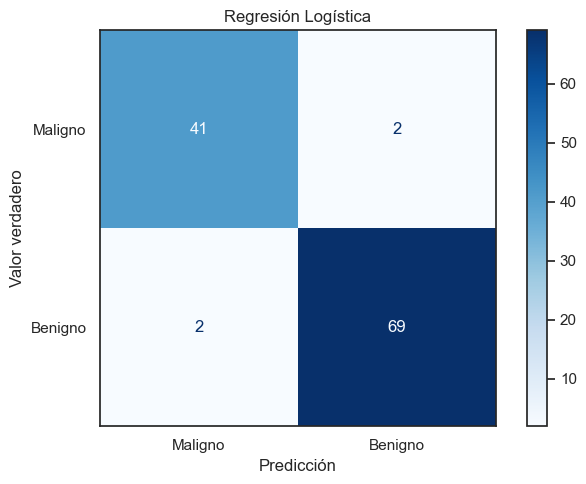

Modelo,Características,Escalamiento,Búsqueda Hp,Accuracy,Precision,Specificity,Balanced Accuracy,Recall,F1-Score
Regresión Logística,4,Standard,Grilla,0.964900,0.971800,0.953500,0.962700,0.971800,0.971800


In [62]:
mname = "Regresión Logística"

# Utilizando Exactitud como la métrica de referencia
lr_y_pred, lr_classes, lr_y_probs, best_p = LogRegressionHiperP (Xs_train_scaled, ys_train, Xs_test_scaled, ys_test, param_grid, 1000, 5, "accuracy")

print (best_p)

confM = showConfMatrix(ys_test, lr_y_pred, list(map(lambda x: target_esn[x], lr_classes)), mname, 'Blues', n_graph=1)
    
lrs_metrics = getMetrics(ys_test, lr_y_pred, confM, mname)

df_metrics_lr = printMetrics(lrs_metrics, len(features), "Standard", "Grilla")

display(df_metrics_lr.style.hide(axis='index'))

roc_results.append([mname, "green", lr_y_probs])

#### SVC

In [63]:
# Grilla de hiperparámetros
param_grid = {
    'C': [0.1, 1, 10, 100],  # Hiperparámetro para la regularización
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],  # Tipos de núcleos
    'gamma': ['scale', 'auto']  # Parámetro del núcleo
}


SVC(C=1, probability=True)


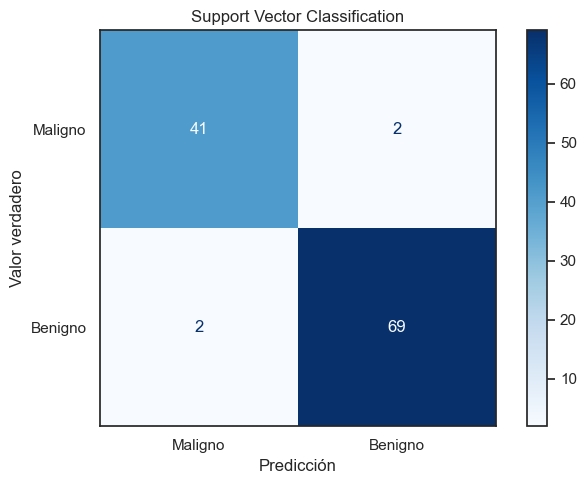

Modelo,Características,Escalamiento,Búsqueda Hp,Accuracy,Precision,Specificity,Balanced Accuracy,Recall,F1-Score
Support Vector Classification,4,Standard,Grilla,0.964900,0.971800,0.953500,0.962700,0.971800,0.971800


In [64]:
mname = "Support Vector Classification"

# Utilizando Exactitud como la métrica de referencia
svm_y_pred, svm_classes, svm_y_probs, best_p = SVCHiperP (Xs_train_scaled, ys_train, Xs_test_scaled, ys_test, param_grid, 5, "accuracy")

print (best_p)

confM = showConfMatrix(ys_test, svm_y_pred, list(map(lambda x: target_esn[x], svm_classes)), mname, 'Blues', n_graph=1)
    
svm_metrics = getMetrics(ys_test, svm_y_pred, confM, mname)

df_metrics_svm = printMetrics(svm_metrics, len(features), "Standard", "Grilla")

display(df_metrics_svm.style.hide(axis='index'))

roc_results.append([mname, "blue", svm_y_probs])

#### Decision Tree Classifier

In [65]:
# Grilla de hiper-parametros
param_grid = {
    'criterion': ['gini', 'entropy'],  # Funcion para medir la calidad de una division
    'max_depth': [None, 10, 20, 30],   # Profundidad máxima del arbol
    'min_samples_split': [2, 5, 10],   # Numero minimo de muestras requeridas para dividir un nodo
    'min_samples_leaf': [1, 2, 4]      # Numero minimo de muestras requeridas para estar en una hoja
}

DecisionTreeClassifier(criterion='entropy', max_depth=20, min_samples_leaf=2)


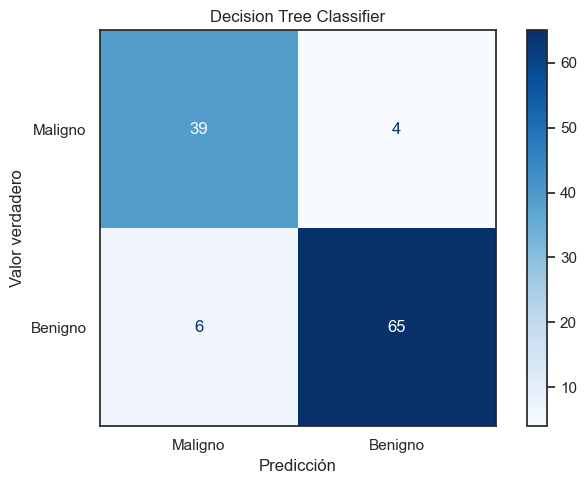

Modelo,Características,Escalamiento,Búsqueda Hp,Accuracy,Precision,Specificity,Balanced Accuracy,Recall,F1-Score
Decision Tree Classifier,4,Standard,Grilla,0.912300,0.942000,0.907000,0.911200,0.915500,0.928600


In [66]:
mname = "Decision Tree Classifier"

# Utilizando Exactitud como la métrica de referencia
dt_y_pred, dt_classes, dt_y_probs, best_p = DecisionTreeHiperP (Xs_train_scaled, ys_train, Xs_test_scaled, ys_test, param_grid, 5, "accuracy")

print (best_p)

confM = showConfMatrix(ys_test, dt_y_pred, list(map(lambda x: target_esn[x], dt_classes)), mname, 'Blues', n_graph=1)
    
dt_metrics = getMetrics(ys_test, dt_y_pred, confM, mname)

df_metrics_dt = printMetrics(dt_metrics, len(features), "Standard", "Grilla")

display(df_metrics_dt.style.hide(axis='index'))

roc_results.append([mname, "orange", dt_y_probs])


#### KNN Classifier

In [67]:
# Grilla de hiperparámetros
param_grid = {
    'n_neighbors': [3, 5, 7, 9, 11],
    'metric': ['euclidean', 'manhattan', 'chebyshev'],
    'weights': ['distance', 'uniform']
}

KNeighborsClassifier(metric='chebyshev', n_neighbors=3, weights='distance')


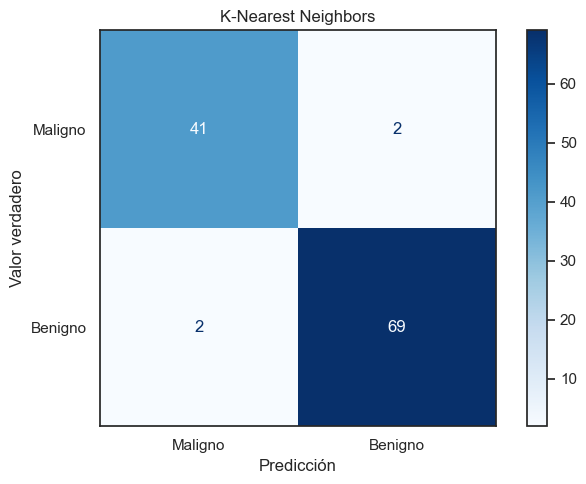

Modelo,Características,Escalamiento,Búsqueda Hp,Accuracy,Precision,Specificity,Balanced Accuracy,Recall,F1-Score
K-Nearest Neighbors,4,Standard,Grilla,0.964900,0.971800,0.953500,0.962700,0.971800,0.971800


In [68]:
mname = "K-Nearest Neighbors"

# Utilizando Exactitud como la métrica de referencia
knn_y_pred, knn_classes, best_p = KnnHiperP (Xs_train_scaled, ys_train, Xs_test_scaled, ys_test, param_grid, 5, "accuracy")

print (best_p)

confM = showConfMatrix(ys_test, knn_y_pred, list(map(lambda x: target_esn[x], knn_classes)), mname, 'Blues', n_graph=1)
    
knn_metrics = getMetrics(ys_test, knn_y_pred, confM, mname)

df_metrics_knn = printMetrics(knn_metrics, len(features), "Standard", "Grilla")

display(df_metrics_knn.style.hide(axis='index'))


#### Perceptron

In [69]:
# Grilla de hiper-parametros
param_grid = {
    'penalty': [None, 'l2', 'l1', 'elasticnet'],  # Tipo de regularizacion
    'alpha': [0.0001, 0.001, 0.01],  # Parametro de regularizacion
    'max_iter': [1000, 5000, 10000],  # Numero maximo de iteraciones
    'eta0': [1.0, 0.1, 0.01]  # Tasa de aprendizaje inicial
}

Perceptron(penalty='l2')


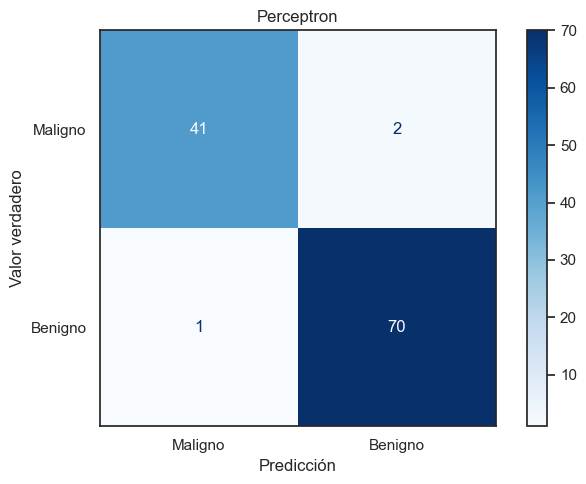

Modelo,Características,Escalamiento,Búsqueda Hp,Accuracy,Precision,Specificity,Balanced Accuracy,Recall,F1-Score
Perceptron,4,Standard,Grilla,0.973700,0.972200,0.953500,0.969700,0.985900,0.979000


In [70]:
mname = "Perceptron"

# Utilizando Exactitud como la métrica de referencia
p_y_pred, p_classes, best_p = PerceptronHiperP (Xs_train_scaled, ys_train, Xs_test_scaled, ys_test, param_grid, 5, "accuracy")

print (best_p)

confM = showConfMatrix(ys_test, p_y_pred, list(map(lambda x: target_esn[x], p_classes)), mname, 'Blues', n_graph=1)
    
p_metrics = getMetrics(ys_test, p_y_pred, confM, mname)

df_metrics_p = printMetrics(p_metrics, len(features), "Standard", "Grilla")

display(df_metrics_p.style.hide(axis='index'))

#### Bagging Classifier

In [71]:
# Modelos base
base_estimators = [
    DecisionTreeClassifier(),
    SVC(probability=True),
    LogisticRegression(),
    Perceptron()
]

# Espacio de hiperparámetros para la búsqueda aleatoria
param_distributions = {
    'estimator': base_estimators,
    'n_estimators': [10, 20, 50, 100],
    'max_samples': [0.5, 0.7, 1.0],
    'max_features': [0.5, 0.7, 1.0],
    'bootstrap': [True, False],
    'bootstrap_features': [True, False]
}

BaggingClassifier(estimator=SVC(probability=True), max_samples=0.7,
                  n_estimators=50, random_state=42)


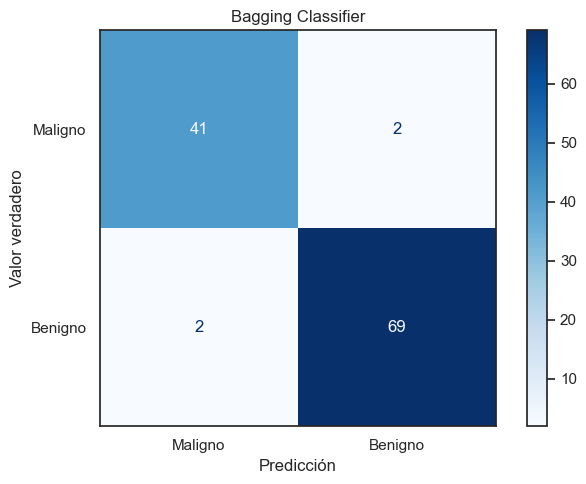

Modelo,Características,Escalamiento,Búsqueda Hp,Accuracy,Precision,Specificity,Balanced Accuracy,Recall,F1-Score
Bagging Classifier,4,Standard,Aleatoria,0.964900,0.971800,0.953500,0.962700,0.971800,0.971800


In [72]:
mname = "Bagging Classifier"

# Utilizando Exactitud como la métrica de referencia
bagg_y_pred, bagg_classes, best_p = EnsambleBagg (Xs_train_scaled, ys_train, Xs_test_scaled, ys_test, base_estimators, param_distributions, 50, "accuracy", 5)

print(best_p)

confM = showConfMatrix(ys_test, bagg_y_pred, list(map(lambda x: target_esn[x], bagg_classes)), mname, 'Blues', n_graph=1)
    
bagg_metrics = getMetrics(ys_test, bagg_y_pred, confM, mname)

df_metrics_bagg = printMetrics(bagg_metrics, len(features), "Standard", "Aleatoria")

display(df_metrics_bagg.style.hide(axis='index'))
   


#### XGBoost

In [73]:
# Grilla de hiper-parámetros
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 1],
    'colsample_bytree': [0.8, 1]
}


Fitting 5 folds for each of 108 candidates, totalling 540 fits
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.8, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.2, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=50, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)


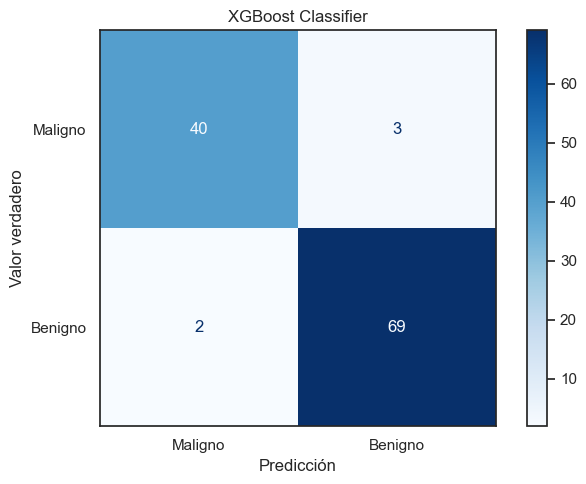

Modelo,Características,Escalamiento,Búsqueda Hp,Accuracy,Precision,Specificity,Balanced Accuracy,Recall,F1-Score
XGBoost Classifier,4,Standard,Grilla,0.956100,0.958300,0.930200,0.951000,0.971800,0.965000


In [74]:
mname = "XGBoost Classifier"

# Utilizando Exactitud como la métrica de referencia
boost_y_pred, boost_classes, boost_y_probs, best_p = EnsambleBoost (Xs_train_scaled, ys_train, Xs_test_scaled, ys_test, param_grid, "accuracy", 5)

print(best_p)

confM = showConfMatrix(ys_test, boost_y_pred, list(map(lambda x: target_esn[x], boost_classes)), mname, 'Blues', n_graph=1)
    
boost_metrics = getMetrics(ys_test, boost_y_pred, confM, mname)

df_metrics_boost = printMetrics(boost_metrics, len(features), "Standard", "Grilla")

display(df_metrics_boost.style.hide(axis='index'))
   
roc_results.append([mname, "violet", boost_y_probs])

#### Cuadro comparativo - Conclusiones

In [75]:
df_selection_results = pd.concat([df_metrics_lr, 
                                  df_metrics_svm, 
                                  df_metrics_dt, 
                                  df_metrics_knn, 
                                  df_metrics_p,
                                  df_metrics_bagg,
                                  df_metrics_boost])

display(df_selection_results.style.hide(axis='index'))

Modelo,Características,Escalamiento,Búsqueda Hp,Accuracy,Precision,Specificity,Balanced Accuracy,Recall,F1-Score
Regresión Logística,4,Standard,Grilla,0.964900,0.971800,0.953500,0.962700,0.971800,0.971800
Support Vector Classification,4,Standard,Grilla,0.964900,0.971800,0.953500,0.962700,0.971800,0.971800
Decision Tree Classifier,4,Standard,Grilla,0.912300,0.942000,0.907000,0.911200,0.915500,0.928600
K-Nearest Neighbors,4,Standard,Grilla,0.964900,0.971800,0.953500,0.962700,0.971800,0.971800
Perceptron,4,Standard,Grilla,0.973700,0.972200,0.953500,0.969700,0.985900,0.979000
Bagging Classifier,4,Standard,Aleatoria,0.964900,0.971800,0.953500,0.962700,0.971800,0.971800
XGBoost Classifier,4,Standard,Grilla,0.956100,0.958300,0.930200,0.951000,0.971800,0.965000


**Observaciones:**

En general las métricas arrojan una buena performance de todos los modelos. 
Obtener desempeños similares con una cantidad inferior de características es un buen resultado de por si.

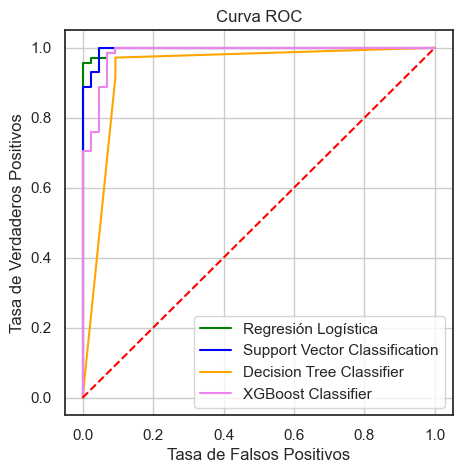

,Modelo,AUC
0,Regresión Logística,0.997380
1,Support Vector Classification,0.995742
3,XGBoost Classifier,0.984605
2,Decision Tree Classifier,0.936783


In [76]:
# Curva ROC y Área bajo la curva de los modelos que entregaron probabilidades

auc_results = showROC(ys_test, roc_results)
df_auc = pd.DataFrame(list(auc_results.items()), columns=['Modelo', 'AUC'])
display(df_auc.sort_values(by='AUC', ascending=False))

## Reducción de dimensionalidad

### T-SNE

Aplicamos reducción de dimensionalidad (2 y 3 dimensiones) con t-sne para verificar visualmente cómo se distribuyen los datos para la clasificación.

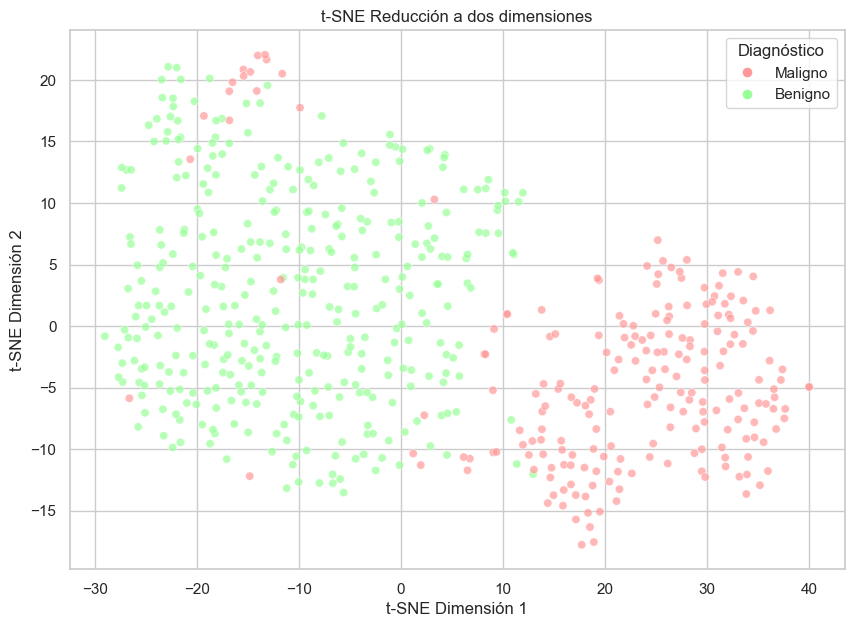

In [77]:
# Escalar los datos
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Configurar y ajustar t-SNE para dos dimensiones
tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X_scaled)

# Crear un DataFrame para los resultados de t-SNE
df_tsne = pd.DataFrame(data=X_tsne, columns=['TSNE1', 'TSNE2'])
df_tsne['target'] = y
#df_tsne['target_name'] = df_tsne['target'].map(dict(enumerate(target_names)))

sns.set(style="whitegrid")
plt.figure(figsize=(10, 7))
ax = sns.scatterplot(x='TSNE1', y='TSNE2', hue='target', data=df_tsne, palette=palette, alpha=0.7)
plt.title('t-SNE Reducción a dos dimensiones')
plt.xlabel('t-SNE Dimensión 1')
plt.ylabel('t-SNE Dimensión 2')

handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=palette[i], markersize=8, label=target_esn[i]) for i in target_esn]
plt.legend(handles=handles, title='Diagnóstico', loc='upper right')

plt.show()


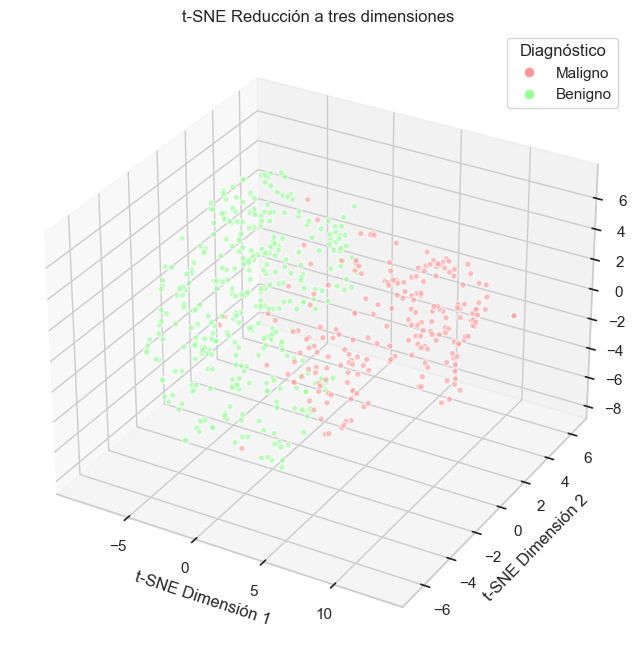

In [78]:
# Aplicar t-SNE para reducción a tres dimensiones
tsne = TSNE(n_components=3, random_state=42)
X_tsne = tsne.fit_transform(X_scaled)

df_tsne = pd.DataFrame(data=X_tsne, columns=['TSNE1', 'TSNE2', 'TSNE3'])
df_tsne['target'] = y

fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')


colors = [palette[label] for label in df_tsne['target']]
 
ax.scatter(df_tsne['TSNE1'], df_tsne['TSNE2'], df_tsne['TSNE3'], c=colors, alpha=0.6, edgecolors='w')

# Etiquetas y título
ax.set_xlabel('t-SNE Dimensión 1')
ax.set_ylabel('t-SNE Dimensión 2')
ax.set_zlabel('t-SNE Dimensión 3')
ax.set_title('t-SNE Reducción a tres dimensiones')

#handles = [patches.Patch(color=palette['maligno'], label='Maligno'), patches.Patch(color=palette['benigno'], label='Benigno')]
#plt.legend(handles=handles, title='Diagnóstico', loc='best')

handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=palette[i], markersize=8, label=target_esn[i]) for i in target_esn]
plt.legend(handles=handles, title='Diagnóstico', loc='best')
plt.show()


### PCA

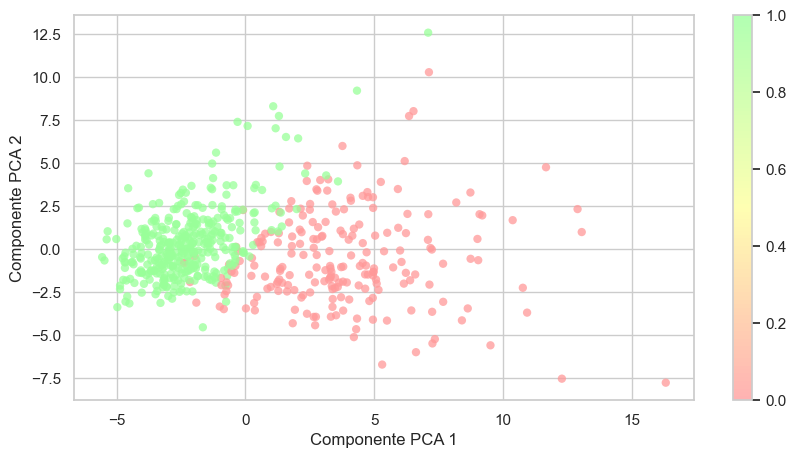

In [79]:
# Aplicar PCA - Retener el 95% de varianza
pca = PCA(n_components=0.95)
X_pca = pca.fit_transform(X_scaled)

# Visualizar los datos
custom_cmap = LinearSegmentedColormap.from_list("custom_cmap", [palette[0], palette[-1], palette[1]], N=100)
sns.set(style="whitegrid")
plt.figure(figsize=(10, 5)) 
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=data.target, edgecolor='none', alpha=0.75, cmap=custom_cmap)
plt.xlabel('Componente PCA 1')
plt.ylabel('Componente PCA 2')
plt.colorbar();  

plt.show()


In [80]:
# Aplicar PCA
pca = PCA()
pca.fit(X_scaled)

# Calcular la varianza explicada acumulada
explained_variance_cumulative = np.cumsum(pca.explained_variance_ratio_)

# Encontrar el número de componentes que capturan el 100% de la varianza
vars = [0.8, 0.85, 0.9, 0.95, 0.96, 0.97, 0.98, 0.99, 1.0]

for i in vars:
    num_components_100_var = np.argmax(explained_variance_cumulative >= i) + 1

    print(f"Número de componentes necesarios para capturar el {i*100}% de la varianza: {num_components_100_var}")


Número de componentes necesarios para capturar el 80.0% de la varianza: 5
Número de componentes necesarios para capturar el 85.0% de la varianza: 6
Número de componentes necesarios para capturar el 90.0% de la varianza: 7
Número de componentes necesarios para capturar el 95.0% de la varianza: 10
Número de componentes necesarios para capturar el 96.0% de la varianza: 11
Número de componentes necesarios para capturar el 97.0% de la varianza: 12
Número de componentes necesarios para capturar el 98.0% de la varianza: 14
Número de componentes necesarios para capturar el 99.0% de la varianza: 17
Número de componentes necesarios para capturar el 100.0% de la varianza: 30


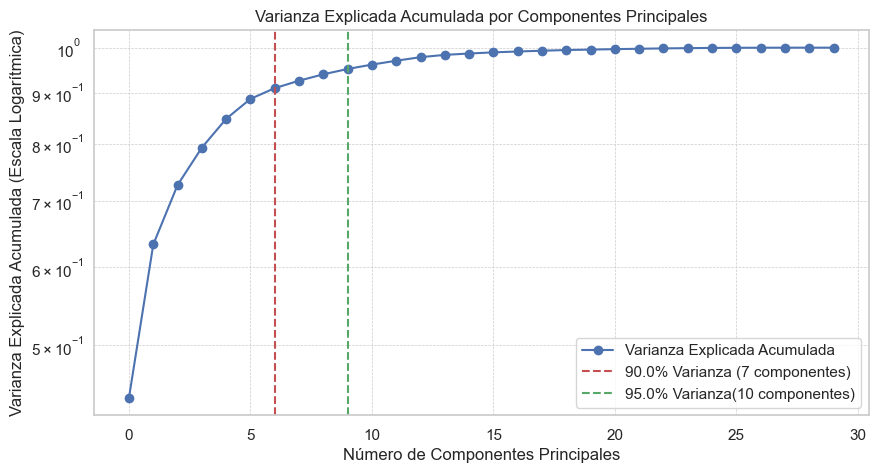

In [81]:
# Encontrar el número de componentes necesarios para capturar al menos el X% de la varianza
threshold1 = 0.90
threshold2 = 0.95
num_components_t1_var = np.argmax(explained_variance_cumulative >= threshold1) + 1
num_components_t2_var = np.argmax(explained_variance_cumulative >= threshold2) + 1

# Graficar la varianza explicada acumulada
plt.figure(figsize=(10, 5))
plt.plot(explained_variance_cumulative, marker='o', label='Varianza Explicada Acumulada')
plt.axvline(x=num_components_t1_var - 1, color='r', linestyle='--', label=f"{threshold1*100}% Varianza ({num_components_t1_var} componentes)")
plt.axvline(x=num_components_t2_var - 1, color='g', linestyle='--', label=f"{threshold2*100}% Varianza({num_components_t2_var} componentes)")

# Configurar la escala logarítmica en el eje y
plt.yscale('log')

# Añadir etiquetas y título
plt.xlabel('Número de Componentes Principales')
plt.ylabel('Varianza Explicada Acumulada (Escala Logarítmica)')
plt.title('Varianza Explicada Acumulada por Componentes Principales')
plt.legend()
plt.grid(True, which="both", ls="--", linewidth=0.5)
plt.show()


### UMAP

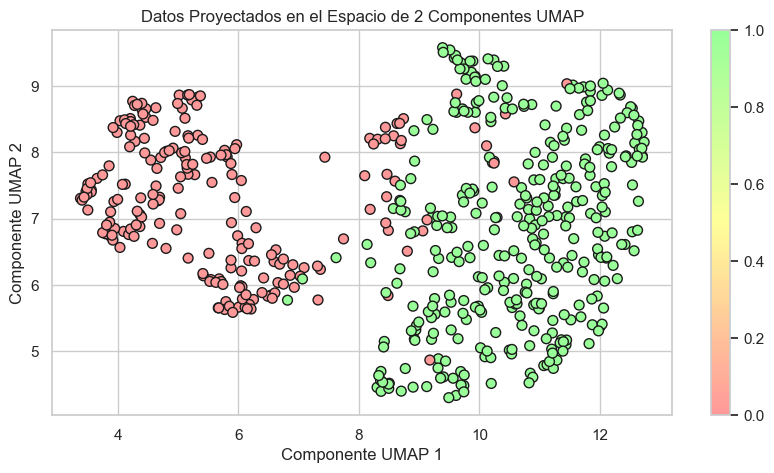

In [82]:
# Aplicar UMAP para reducir la dimensionalidad a 2 componentes
umap_model = umap.UMAP(n_components=2, n_jobs=1, random_state=42)
X_umap_2 = umap_model.fit_transform(X_scaled)

# Graficar los datos en el espacio reducido
plt.figure(figsize=(10, 5))
scatter = plt.scatter(X_umap_2[:, 0], X_umap_2[:, 1], c=y, cmap=custom_cmap, edgecolor='k', s=50)
plt.xlabel('Componente UMAP 1')
plt.ylabel('Componente UMAP 2')
plt.title('Datos Proyectados en el Espacio de 2 Componentes UMAP')
plt.colorbar(scatter)
plt.grid(True)
plt.show()


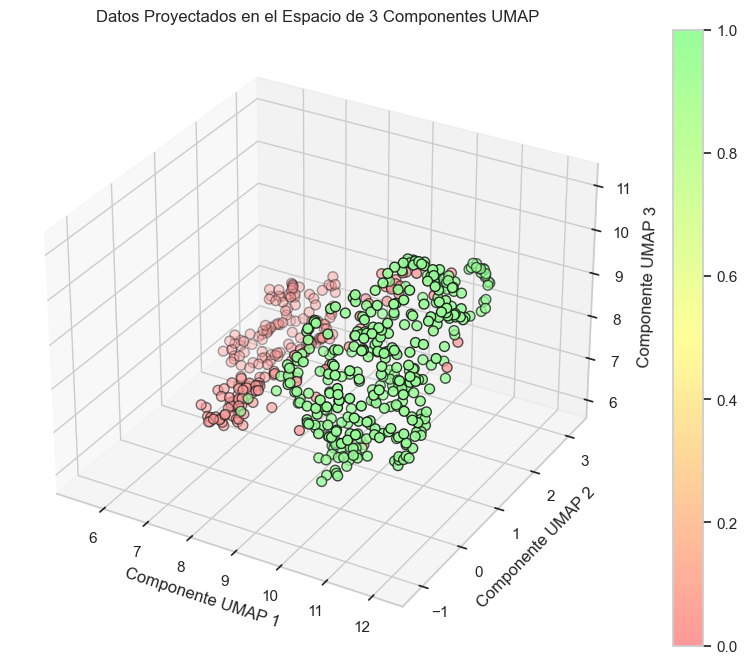

In [83]:
# Aplicar UMAP para reducir la dimensionalidad a 3 componentes
umap_model = umap.UMAP(n_components=3, n_jobs=1, random_state=42)
X_umap_3 = umap_model.fit_transform(X_scaled)

# Graficar los datos en el espacio reducido en 3D
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(X_umap_3[:, 0], X_umap_3[:, 1], X_umap_3[:, 2], c=y, cmap=custom_cmap, edgecolor='k', s=50)

ax.set_xlabel('Componente UMAP 1')
ax.set_ylabel('Componente UMAP 2')
ax.set_zlabel('Componente UMAP 3')
ax.set_title('Datos Proyectados en el Espacio de 3 Componentes UMAP')
plt.colorbar(scatter)

plt.show()


**Observaciones:**

Con todas las técnicas comprobamos que los datos están bien clusterizados y por eso el buen resultado de los modelos de clasificación.


## Conclusiones

El conjunto de datos presentado en el repositorio de UCI dataset se encuentra fuertemente procesado. Es decir, en el análisis propuesto en este trabajo se pudo constatar la ausencia de datos faltantes ni registros repetidos. Además se pudo verificar que los tipos de datos se encuentran unificados y sin inconsistencias.

Por otro lado, al estudiar la distribución de las características para ambas clases (tumor maligno/benigno), se observó que si bien en algunas características es posible discernir rangos de dominio en los que se pueden diferenciar ambas clases, en otras resulta más difícil dado que la distribución de ambas clases se superponen. Por otro lado, en todos los casos se pudo apreciar que la distribución de las características en el caso benigno tienen menos dispersión y máximos mayores que en el caso maligno. En cuanto a la variable objetivo, se pudo ver que tiene una baja cardinalidad (binaria) y no se encuentra balanceada.

También se encontró una elevada correlación lineal entre algunas características. Como es el caso de las variables medias y en su peor versión, como es el caso de radius mean y radius worst a modo de ejemplo. Además se verificaron dependencia esperables entre características como por ejemplo el radio y el perímetro o entre el radio y el área (lineal y cuadrática respectivamente). Esto sugirió realizar experimentos de evaluación de desempeño de modelos de aprendizaje con un subconjunto de características.

En cuanto a los outliers se pudo identificar que todas las características presentan valores por encima de los tres desvíos estándar. Si bien se consideró inicialmente aplicar alguna técnica sobre ellos, los resultados de desempeño de modelos de predicción sugirió que no se trataban de errores, o al menos no tenía un impacto sobre este.

Se aplicaron diferentes técnicas de selección de variables y se evaluaron diferentes modelos como regresión logística, árboles, svc, perceptrón y ensambles. Además, se variaron o combinaron técnicas usando validación cruzada, búsqueda de hiperparámetros por grilla y diferentes métodos de escalado. En todos los casos se pudo apreciar una precisión similar a la indicada por UCI para el dataset, lo que invita a pensar que al aplicar estas técnicas solo se mejora el hecho de manipular menos cantidad de características pero no de desempeño del modelo. También cabe destacar que en todos los modelos la cantidad de veces que se predijo un diagnóstico benigno que en realidad era maligno (tal vez el peor escenario en una situación de paciente real) fue extremadamente bajo.

Además, se pudo constatar a partir de la curva de aprendizaje que para tamaños de conjunto de entrenamiento del orden de 350 el 'accuracy' de ambos conjunto converge (también se aprecia una reducción de la varianza de la métrica), lo que es un buen indicador de que el modelo generaliza.

Por último, a partir de la reducción de dimensiones con diferentes técnicas se pudo comprobar visualmente que el conjunto de datos provisto tiene una buena separación de clases, salvo algunos casos aislados, y por esa razón todos los modelos arrojan buenos resultados de performance.

## Bibliografía

* Isabelle Guyon, Andre Elisseeff (2003). An introduction to variable and feature selection. Journal of Machine Learning Research 3 (2003) 1157-1182

* Wolberg,William, Mangasarian,Olvi, Street,Nick, and Street,W.. (1995). Breast Cancer Wisconsin (Diagnostic). UCI Machine Learning Repository. https://doi.org/10.24432/C5DW2B.

* W. Street, W. Wolberg, O. Mangasarian. (1992)
Nuclear feature extraction for breast tumor diagnosis.
Published in Electronic imaging.